# Styling

In [1]:
my_colors_dict = {  'redberry'      :'#970000',
                    'tamarillo'     :'#8b1212',
                    'venetianred'   :'#770023',
                    'monarch'       :'#850731',
                    'toledo'        :'#40001b',
                    'shipgrey'      :'#423B4B',
                    'charde'        :'#20202c',
                    'woodsmoke'     :'#171719',
                    'mediumpurple'  :'#795FD7',
                    'curciousblue'  :'#2f99e2',
                    'electric'      :'#795fd7',
                    'deus_ex_gold'  :'#eda723',
                    'meduza'        :'#b5895b',
                    'meduza_gold'   :'#B5965B',
                    'blob_g'        :'#546ea9',
                    'blob_e'        :'#fd6e6e',
                    'blob_post'     :'#1b346e',
                    'g_state_mark'  :'#849cd4',
                    'e_state_mark'  :'#fe9393',
                    'meduza_dark'   :'#262626',
                    'gauss_green'   :'#bacc5f'
}


def set_font(filename='Forza-Book.ttf'):
    '''
    Takes the name of file.ttf
    File must be in folder of
    Python27\Lib\site-packages\matplotlib\mpl-data\fonts\ttf
    return prop
    wich could be use as in an example:
    ax.set_title('This is a special font: {}'.format(fname), fontproperties=prop)
    fontproperties = set_font('Forza-Book.ttf')
    '''
    ## special font from ttf
    ###+===============================######
    import os
    from matplotlib import font_manager as fm, rcParams

    str_adress_name = "fonts/ttf/" + filename

    fpath = os.path.join(rcParams["datapath"], str_adress_name)
    prop = fm.FontProperties(fname=fpath)
    # fname = os.path.split(fpath)[1]

    return prop


# Fidelity versus t_read and n_phot


This is a program for work with data type: Fid_vs_tread
For each fidelity measurement creates an object contains the data, plots and extracted values of fidelity etc
For each measurement fid_vs_tread also creates an object, contains sequence of objects of each fidelity measurement plus sequence of extracted values and plots


### imports

In [2]:
import numpy as np
from matplotlib import pyplot as plt

#my library with classes
from lib_SSResult import SSResult

import os

# Find all the files

In [3]:
def get_adress_lists(path):
    '''
    Takes path to folder. Returns [ list_of_datafiles, list_of_parameter_files ]
    '''
    def recognize_dir(dirname):
        '''
        function to check is a given name of directory correspond to parameters or data
        '''
        if ('_SingleShot' in dirname) or ('IQ_postselection' in dirname):
            return 'data'
        elif 'parameters' in dirname:
            return 'param'
        else:
            return 'no'
        
    listdir = os.listdir(path)
    
    list_dat_f = []
    list_param_f = []
    for n in range(len(listdir)):
    #     print 'dirname:', listdir[n]
    #     print 'type:', recognize_dir(listdir[n])
    #     print ''

        if recognize_dir(listdir[n]) is not 'no':

            adress = path+'\\'+listdir[n]
            listin = os.listdir(adress)
            for f in listin:
                if f.endswith('.dat'):
                    adress = adress +'\\'+ f

            if recognize_dir(listdir[n]) == 'param':
                list_param_f.append(adress)
            if recognize_dir(listdir[n]) == 'data':
                list_dat_f.append(adress)

    return [list_dat_f, list_param_f]
#########################

### Create list of file adresses

In [4]:
#rdt = 16
path16 = 'C:\Users\V\Scripts\SingleShotReadout\Fid_vs_tread_VS__Rudat\Rdt=16_jpa_192447_______Fidelity_vs_time\All_here_rdt=16'
#rdt = 19
path19 = 'C:\Users\V\Scripts\SingleShotReadout\Fid_vs_tread_VS__Rudat\Rdt=19_jpa_154038_______Fidelity_vs_time\All_here_rdt=19'
#rdt = 22
path22 = 'C:\Users\V\Scripts\SingleShotReadout\Fid_vs_tread_VS__Rudat\Rdt=22_jpa_144004_______Fidelity_vs_time\All_here_rdt=22'
#rdt = 22 (no jpa)
path22nj = 'C:\Users\V\Scripts\SingleShotReadout\Fid_vs_tread_VS__Rudat\Rdt=22_nojpa_012355_______Fidelity_vs_time\All_here_rdt=22'

[list_dat_f16, list_param_f16] = get_adress_lists(path16)
[list_dat_f19, list_param_f19] = get_adress_lists(path19)
[list_dat_f22, list_param_f22] = get_adress_lists(path22)
[list_dat_f22nj, list_param_f22nj] = get_adress_lists(path22nj)


####### old data ####
path_all_old_data = 'C:\Users\V\Scripts\SingleShotReadout\Fid_vs_tread_VS__Rudat\z_old_data_f_vs_t\\'

path_x1 = path_all_old_data + '180913_1219_f_vs_t'
path_x2 = path_all_old_data + '180913_1843_f_vs_t'
path_x3 = path_all_old_data + '180918_1230_f_vs_t'
path_x4 = path_all_old_data + '180918_1255_f_vs_t'
path_x5 = path_all_old_data + '180919_1905_f_vs_t_main'
path_x6 = path_all_old_data + '180925_1848_f_vs_t'
path_x7 = path_all_old_data + '180927_1243_f_vs_t'
path_x8 = path_all_old_data + '180927_1257_f_vs_t'
path_x9 = path_all_old_data + '180927_1905_f_vs_t'
path_x10 = path_all_old_data + '190619_1352_f_vs_t'
path_x11 = path_all_old_data + '190619_1921_f_vs_t'
path_x12 = path_all_old_data + '190619_2014_f_vs_t'
path_x13 = path_all_old_data + '190619_2107_f_vs_t'
path_x14 = path_all_old_data + '190619_2200_f_vs_t'


[list_dat_x1, list_param_x1] = get_adress_lists(path_x1)
[list_dat_x2, list_param_x2] = get_adress_lists(path_x2)
[list_dat_x3, list_param_x3] = get_adress_lists(path_x3)
[list_dat_x4, list_param_x4] = get_adress_lists(path_x4)
[list_dat_x5, list_param_x5] = get_adress_lists(path_x5)
[list_dat_x6, list_param_x6] = get_adress_lists(path_x6)
[list_dat_x7, list_param_x7] = get_adress_lists(path_x7)
[list_dat_x8, list_param_x8] = get_adress_lists(path_x8)
[list_dat_x9, list_param_x9] = get_adress_lists(path_x9)
[list_dat_x10, list_param_x10] = get_adress_lists(path_x10)
[list_dat_x11, list_param_x11] = get_adress_lists(path_x11)
[list_dat_x12, list_param_x12] = get_adress_lists(path_x12)
[list_dat_x13, list_param_x13] = get_adress_lists(path_x13)
[list_dat_x14, list_param_x14] = get_adress_lists(path_x14)
    

# Problem of length lists 

In [112]:

    
a =   list_dat_x14
b = list_param_x14




def len_lists(list1,list2):
    if len(list1) == len(list2):
        return True
    else:
        return False
    
s = len_lists(a,b)
print s

if s  == False:
    print len(a)
    print len(b)
    print a[0]

True


### For load all the data (now not memory consuming)

In [7]:
def load_data( list_dat_f, list_param_f ):
    list_ssres = []
    
    for i in range(len(list_dat_f)):
        m = SSResult(list_dat_f[i], paramfile = list_param_f[i])
        m.erase_data('all') 
        list_ssres.append(m)
        
    print 'Done!'
    return list_ssres

##  Loading . . . 

In [8]:
try:
    list_ssr_16 = load_data(list_dat_f16, list_param_f16)
except:
        print 'cant load! \n STOP!'

data loaded
new center of blobs:  -0.00130121606035   0.00130121606035
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.000762037580199   0.0019723265153
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.000928743458011   0.00169107725975
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00145728089922   0.00145728089922
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00110104152171   0.00151112679633
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.000993392456931   0.00172847900646
Fidelity was calculated
Object is created
__Raw data er

data loaded
new center of blobs:  -0.00814763865955   0.00814763865955
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00794270771156   0.00865331883609
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00783908549509   0.00861335507124
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00821363594017   0.00821363594017
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00836551983482   0.0082212695703
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00835633949858   0.00824455274286
Fidelity was calculated
Object is created
__Raw data e

data loaded
new center of blobs:  -0.0152280368903   0.0152280368903
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.019535037984   0.0143492880492
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0195183138051   0.0143548439288
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0148067903411   0.0148067903411
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0198723406598   0.0137066375562
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0199045837829   0.0136964616821
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0178720362293   0.0178720362293
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0276415134256   0.0151941176454
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0276282820743   0.0151939400081
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0178150857428   0.0178150857428
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0302546462962   0.0123825994886
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.030269350131   0.0123792348666
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0180628001791   0.0180628001791
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0270128067495   0.01832219923
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0269928318713   0.0183275285312
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0181655501072   0.0181655501072
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0248755467585   0.0214626578217
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0249122420744   0.0214711503586
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0176979860532   0.0176979860532
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0221567509324   0.0245167738186
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0221326353427   0.024511805715
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0175595566195   0.0175595566195
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0242617931305   0.0227664473989
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0242580841081   0.0227708814175
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.016782677849   0.016782677849
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0181173309577   0.0277300840903
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0180544676524   0.0277135564875
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0166951053818   0.0166951053818
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0167076457544   0.0289232213608
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0167212409017   0.0289068463392
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0159926925894   0.0159926925894
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0167515045018   0.029032402271
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0167664909001   0.0290318733611
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0160885192639   0.0160885192639
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.01509582302   0.0304119130552
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0151177962487   0.0304039702149
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0152903719757   0.0152903719757
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.015272968377   0.0296412667639
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0152775168509   0.0296366245929
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0151106759847   0.0151106759847
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.014062956979   0.0305758536118
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0141436984962   0.0305746206981
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0141400545493   0.0141400545493
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0142821329109   0.0295012747939
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0142999347916   0.0294992493101
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0138432949141   0.0138432949141
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0141152522617   0.029074033652
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0141699809753   0.0290757806007
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0130924952591   0.0130924952591
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0119627073575   0.0298994484349
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0119894319974   0.0298836739303
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0131149163567   0.0131149163567
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0130615727677   0.0287212444588
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.013056444385   0.0287306499873
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0137287319836   0.0137287319836
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0121774818913   0.0330575085485
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0121659009958   0.0330569825434
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0137202504996   0.0137202504996
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0132592553199   0.0324276239103
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0132948165995   0.0324424011223
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0155983542673   0.0155983542673
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0371092599224   0.0168938375396
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0370812650867   0.0166450814395
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0159304704447   0.0159304704447
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0159295243816   0.0375595660907
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0158905552236   0.03755791858
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.014967071801   0.014967071801
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0155025938564   0.0370335291157
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0155106215835   0.0370373834566
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0146891693923   0.0146891693923
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.015621384869   0.0363103645522
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.015598364826   0.0363029919067
Fidelity was calculated
Object is created
__Raw data erased!
__Normed

new center of blobs:  -0.0132098152241   0.0132098152241
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0122359054362   0.0372149029015
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.012246913351   0.0372011226487
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0132961547487   0.0132961547487
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.014208954566   0.0352190135611
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0142047670645   0.0352285399562
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data eras

data loaded
new center of blobs:  -0.0121824596068   0.0121824596068
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0142418425649   0.032218543986
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0143064619967   0.0322318687322
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0121841857807   0.0121841857807
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0113330306518   0.0346259735288
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0113738292165   0.034634526989
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0112680428339   0.0112680428339
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0103494857098   0.0339296131335
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0103186511567   0.0339388325368
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0115249121974   0.0115249121974
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0094775739952   0.0352061805814
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00942388530235   0.035205873198
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.01082712022   0.01082712022
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0102388016049   0.0329737945276
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0102554935845   0.0329732286137
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0110239127133   0.0110239127133
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0103486821844   0.0325736613451
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.010320778473   0.0325777463053
Fidelity was calculated
Object is created
__Raw data erased!
__Normed 

data loaded
new center of blobs:  -0.0103123640092   0.0103123640092
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00961632017168   0.0324408111603
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00959748602355   0.0324492925326
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0105856674717   0.0105856674717
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0103943024068   0.0314764943167
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0103921940872   0.0314832792387
Fidelity was calculated
Object is created
__Raw data erased!
__

data loaded
new center of blobs:  -0.00953151584744   0.00953151584744
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00901689862682   0.0311820875265
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0089999489242   0.0311739035315
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00924681425827   0.00924681425827
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00886234976875   0.0313271691062
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00891743463719   0.0313258801257
Fidelity was calculated
Object is created
__Raw data erase

data loaded
new center of blobs:  -0.00888736221536   0.00888736221536
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00782614358688   0.0311769643862
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0078379795211   0.0311808482103
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00882762970566   0.00882762970566
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00791749559752   0.0308789493991
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00795507260252   0.0308786491771
Fidelity was calculated
Object is created
__Raw data erase

data loaded
new center of blobs:  -0.00912185618658   0.00912185618658
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.010241075442   0.0302816421983
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0102679808257   0.0302850746374
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00933876691833   0.00933876691833
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00829381577334   0.0324399735904
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00830598005638   0.0324421239574
Fidelity was calculated
Object is created
__Raw data erased!

data loaded
new center of blobs:  -0.00957429732057   0.00957429732057
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00968957174117   0.0341500864622
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00971766978392   0.0341307967611
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00994510584374   0.00994510584374
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00962727956891   0.0348082198858
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00961698959217   0.0347933002375
Fidelity was calculated
Object is created
__Raw data eras

data loaded
new center of blobs:  -0.00944325583255   0.00944325583255
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0108011723626   0.0335828627984
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0107588112237   0.0335808430167
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00930774378346   0.00930774378346
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0104319715383   0.0342351024092
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0103940865727   0.0342498677623
Fidelity was calculated
Object is created
__Raw data erased!


data loaded
new center of blobs:  -0.00895252419772   0.00895252419772
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00951786575182   0.0347541007701
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00953923930624   0.0347526209126
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00928710015345   0.00928710015345
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00888799402004   0.0350914739948
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0088987774225   0.03508406873
Fidelity was calculated
Object is created
__Raw data erased!

data loaded
new center of blobs:  -0.00871944550386   0.00871944550386
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0085097466133   0.0342158620252
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00854523837842   0.0342169978514
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00857704595919   0.00857704595919
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00923082233166   0.0327744132641
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00923983329806   0.0327686413254
Fidelity was calculated
Object is created
__Raw data erase

data loaded
new center of blobs:  -0.00821792250585   0.00821792250585
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00864202580212   0.0324875257289
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00865980178115   0.0325017616896
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00803033353784   0.00803033353784
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00820829329812   0.0323419333216
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00820946913573   0.032357450875
Fidelity was calculated
Object is created
__Raw data erase

data loaded
new center of blobs:  -0.00761552332705   0.00761552332705
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00735690772025   0.032370644487
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00735699598798   0.0323665597102
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00751788463577   0.00751788463577
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00767305536064   0.0317237962976
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00769602935067   0.0317205918456
Fidelity was calculated
Object is created
__Raw data erase

data loaded
new center of blobs:  -0.00717685096291   0.00717685096291
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00635828825018   0.0326291702987
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0063781410918   0.0326111605819
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00719394866006   0.00719394866006
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00849185577561   0.0299164180444
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0085607160713   0.0299284279233
Fidelity was calculated
Object is created
__Raw data erased

data loaded
new center of blobs:  -0.00707301201689   0.00707301201689
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00709579907212   0.0307521817107
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00709707659529   0.0307447545682
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00704814186006   0.00704814186006
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00694903525152   0.0308719440289
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00695161103783   0.0308532444678
Fidelity was calculated
Object is created
__Raw data eras

data loaded
new center of blobs:  -0.00641533433871   0.00641533433871
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00658183720577   0.0309351962064
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00658354490501   0.0309524881347
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00664923805254   0.00664923805254
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0075405415549   0.0297348582547
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00757838677731   0.0297137658215
Fidelity was calculated
Object is created
__Raw data erase

In [9]:
try:
    list_ssr_19 = load_data(list_dat_f19, list_param_f19)
except:
        print 'cant load! \n STOP!'

data loaded
new center of blobs:  -0.00090388502908   0.00090388502908
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00336809811929   0.00319914262557
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.00394945889099   0.00289563560719
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00104842600897   0.00104842600897
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00365632829014   0.00183630751356
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.00092527090996   0.002309389492
Fidelity was calculated
Object is created
__Raw data erased

data loaded
new center of blobs:  -0.0053107853278   0.0053107853278
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00400212023997   0.00553360681757
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00342236390633   0.00550329778499
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00557487047706   0.00557487047706
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00312342754021   0.00594744187358
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00353534587184   0.00590997555544
Fidelity was calculated
Object is created
__Raw data er

data loaded
new center of blobs:  -0.00981241298493   0.00981241298493
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0108766424675   0.00863640806432
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0108902322835   0.00864360166232
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00975267815321   0.00975267815321
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0106248432863   0.00870709849606
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0106132343896   0.00873094250504
Fidelity was calculated
Object is created
__Raw data eras

data loaded
new center of blobs:  -0.0150691161543   0.0150691161543
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0185206130139   0.0126283919628
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0185249931028   0.0126202374363
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0147116529195   0.0147116529195
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0181907197286   0.0124745200271
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0181566200786   0.0124733873379
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0168428301223   0.0168428301223
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0219686774964   0.0143116299578
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0220092789899   0.0143205564599
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0167848521201   0.0167848521201
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0240093424315   0.012698566768
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0240703740834   0.0126765216016
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.016686382435   0.016686382435
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0220551593043   0.0147305373088
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0220541407117   0.0147295868006
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0166545727531   0.0166545727531
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0215200629995   0.0152347267334
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0214896139753   0.0152399401543
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0160380898395   0.0160380898395
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0211563248686   0.0143877148353
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0211972878153   0.0143939659092
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.016435504188   0.016435504188
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.022422068264   0.0136594888576
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0224303729543   0.0136597027632
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0154858267757   0.0154858267757
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0187750707972   0.0157607468569
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0187522774694   0.0157595927613
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0156173720096   0.0156173720096
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0206732007233   0.0142614097269
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0206732365709   0.0142670257363
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0146923942609   0.0146923942609
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0162742173861   0.0167347706187
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0162922230605   0.0167283928129
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0146208653515   0.0146208653515
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.017613615287   0.0156235854441
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0176130679904   0.015629848325
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0134026546334   0.0134026546334
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0142722177737   0.0168600234796
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0142739162583   0.0168655572371
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0132590869295   0.0132590869295
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0148798388991   0.0160671519481
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0148789491013   0.0160654800545
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.013210906393   0.013210906393
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0133382381773   0.0192260863251
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0133447929743   0.0192289009288
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0133744706066   0.0133744706066
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0139032619768   0.0189873521296
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0139169779313   0.0189831851239
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0158149334366   0.0158149334366
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0158649032889   0.0222270043058
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0158628299553   0.0222283685115
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0160292752914   0.0160292752914
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0168777346807   0.0214930754671
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0168609872961   0.0214876994569
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0159929140504   0.0159929140504
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0162409654395   0.0229356435954
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0162327104237   0.0229318263432
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0162559710267   0.0162559710267
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0169858760088   0.0223923121938
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0169653215483   0.0223898933079
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0154891845126   0.0154891845126
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0168048233034   0.0212023894494
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0168378578416   0.0212057181571
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0155386854096   0.0155386854096
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0158822407448   0.0221525879477
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0159009612219   0.0221499242256
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0140548909422   0.0140548909422
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.012315492864   0.0228280046493
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0123100606245   0.0228267835465
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0139538774395   0.0139538774395
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0128987729125   0.0223736462643
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0128751688098   0.0223704946911
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0130035312369   0.0130035312369
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0128651486243   0.0203460704888
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0128644832448   0.0203506903349
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0128677955746   0.0128677955746
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0121223104372   0.0202997234111
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0121256509977   0.020302114285
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0135347843928   0.0135347843928
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0124574166521   0.0222419536865
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0124489447489   0.0222319594895
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.013890486577   0.013890486577
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0126029705899   0.0224137768953
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0125747207158   0.0224125531662
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0144826401416   0.0144826401416
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0127658782051   0.0275120248619
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0127606920004   0.0275042893734
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0147116385287   0.0147116385287
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0119845967862   0.02863152895
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.011970351395   0.0286381442058
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0154556787303   0.0154556787303
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0135018998304   0.0271497100452
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0135042381345   0.0271516719311
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0153338837369   0.0153338837369
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0133689052463   0.0275656651577
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0134068824679   0.0275688850501
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0141997839111   0.0141997839111
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0134175670316   0.0244818063864
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0134281631372   0.0244800385525
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0140433546286   0.0140433546286
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0121775566717   0.0258740887295
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0121904801003   0.0258577479778
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.012837501046   0.012837501046
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0108964344167   0.023887534047
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0108713622216   0.0238801615974
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0128419844462   0.0128419844462
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0113364695731   0.0235084721234
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0113653987232   0.0235031262501
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0121207734378   0.0121207734378
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00956345038877   0.0237633165212
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00954308617536   0.0237669663859
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0122850209822   0.0122850209822
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.010297558789   0.0229881883113
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0102821290338   0.0229947471665
Fidelity was calculated
Object is created
__Raw data erased!
__N

data loaded
new center of blobs:  -0.012861603052   0.012861603052
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0105726025109   0.0242264693489
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0105647267454   0.0242255845484
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0127011287084   0.0127011287084
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.010502015088   0.02478849187
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0105096700166   0.0247819377868
Fidelity was calculated
Object is created
__Raw data erased!
__Normed 

data loaded
new center of blobs:  -0.0135629746249   0.0135629746249
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0120897980181   0.0258385014889
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0120928695821   0.025834625504
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0134404151779   0.0134404151779
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0112240272544   0.026686443936
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0112246391893   0.0266870080465
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0120824165699   0.0120824165699
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0102762992963   0.0238949379087
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0102849386498   0.0238868945179
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0119758310946   0.0119758310946
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0104197132903   0.0237581802223
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0104064180103   0.0237626025771
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0110427126839   0.0110427126839
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00897136904412   0.0227628081322
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00897329080041   0.0227516295886
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0111352973623   0.0111352973623
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00900944585928   0.0227832012992
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00901902704179   0.022778398021
Fidelity was calculated
Object is created
__Raw data erased!
_

data loaded
new center of blobs:  -0.0104245943213   0.0104245943213
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00851404867072   0.0217655740516
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00850396838258   0.0217638303279
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0105345575244   0.0105345575244
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00809829644484   0.0220140118991
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00810202705652   0.0220133988707
Fidelity was calculated
Object is created
__Raw data erased!


data loaded
new center of blobs:  -0.0109946569833   0.0109946569833
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00968260647784   0.0220286479668
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00970442687555   0.0220353289857
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0109874944766   0.0109874944766
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00806384302532   0.0238965997641
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00805971900866   0.0238961880902
Fidelity was calculated
Object is created
__Raw data erased!


data loaded
new center of blobs:  -0.0119639366925   0.0119639366925
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00947547621711   0.0254539911858
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00947588078336   0.025446595584
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0116176537139   0.0116176537139
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00973191336502   0.0249624168682
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0097234580253   0.024966429977
Fidelity was calculated
Object is created
__Raw data erased!
__N

data loaded
new center of blobs:  -0.0113886382744   0.0113886382744
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00810541164186   0.0254613238752
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0081079378723   0.0254510509481
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.010944577632   0.010944577632
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00883080706176   0.024524936417
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00883344241224   0.0245202811189
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0106253692041   0.0106253692041
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00877888422999   0.0240123524505
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00877866366409   0.0240131547384
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0108151358656   0.0108151358656
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00896089171059   0.0235945002332
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00896442861053   0.0235939999774
Fidelity was calculated
Object is created
__Raw data erased!


In [10]:
try:
    list_ssr_22 = load_data(list_dat_f22, list_param_f22)
except:
        print 'cant load! \n STOP!'

data loaded
new center of blobs:  -0.000805240712328   0.000805240712328
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.0146448651085   0.00438574421836
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.0134396853708   0.00398456814058
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000907100613604   0.000907100613604
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00747873524314   0.00247226583208
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.00589842209167   0.00239347801988
Fidelity was calculated
Object is created
__Raw data er

data loaded
new center of blobs:  -0.0062250309151   0.0062250309151
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00277017279981   0.00841930906451
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.00352896442876   0.00846638506627
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00644660512238   0.00644660512238
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.000603889493544   0.00883038775068
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.000877126093444   0.00883129243987
Fidelity was calculated
Object is created
__Raw data eras

data loaded
new center of blobs:  -0.0121687950734   0.0121687950734
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0119956473527   0.0122127269721
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0119863874164   0.012174812604
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0118978072047   0.0118978072047
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0120569440621   0.0112678111934
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0119373944888   0.0112821679812
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0151197061839   0.0151197061839
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0173055439833   0.0137872485582
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0173017843482   0.013802355936
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0153105177418   0.0153105177418
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0187259867673   0.0131588806419
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.018750081545   0.0131422218261
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0191517178669   0.0191517178669
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0246762623322   0.0170784289339
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0246932772819   0.0170726014278
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0194740622013   0.0194740622013
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0255905223314   0.0176372372032
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0256223205025   0.0176292252112
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0214804356249   0.0214804356249
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0285194216774   0.0197511352837
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0285151502873   0.0197548579386
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0213122464442   0.0213122464442
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0284637582548   0.0190772861423
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0284463904375   0.0190723773729
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0192968345909   0.0192968345909
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0251801374279   0.017302512367
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0251647667135   0.0172989461567
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.019279795445   0.019279795445
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0256839040156   0.0164478205608
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.025672973562   0.0164484647307
Fidelity was calculated
Object is created
__Raw data erased!
__Normed

data loaded
new center of blobs:  -0.0181304215594   0.0181304215594
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.023563204258   0.0159837265979
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0235631289771   0.0159818289322
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0180424776314   0.0180424776314
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0230460140063   0.0163791739824
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0230598348947   0.0163716898519
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0204828826322   0.0204828826322
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.025288113752   0.0201665161079
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0252999839444   0.0201658460778
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0206436854074   0.0206436854074
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0246237574722   0.0215278827752
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.02461413152   0.0215279626619
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.020744404637   0.020744404637
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0225415748994   0.0242671345827
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0225451054465   0.024273280826
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0203377539639   0.0203377539639
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0234168393682   0.0228295792814
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0234053736364   0.0228302945815
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0188528522494   0.0188528522494
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0211935422895   0.0218471273664
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0211974734287   0.0218485737689
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0188424763408   0.0188424763408
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0206999401435   0.0218404184498
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0206976001017   0.0218333258805
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0173335548285   0.0173335548285
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0182911278367   0.0209876036115
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0182913503843   0.0209886496787
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0173635361731   0.0173635361731
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0178202300136   0.0211534014902
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0178054920067   0.0211554399826
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0167842901376   0.0167842901376
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0170467691333   0.0208242223638
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0170550462236   0.0208215318787
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0167992775148   0.0167992775148
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.017280295617   0.0206934976708
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0172924507384   0.0206956424815
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0169586486028   0.0169586486028
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0163694989177   0.0223043679179
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0163804218415   0.0223034002865
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0171586455617   0.0171586455617
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0160987114372   0.0233124316382
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0160956458028   0.0233182362282
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0201656533898   0.0201656533898
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0180128042576   0.0289103142071
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0180221437421   0.0289132356997
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0197947145793   0.0197947145793
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0170321477923   0.0296268596384
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0170352551833   0.0296313451165
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0176444348555   0.0176444348555
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0159340042319   0.0257351714109
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0159400224335   0.0257365369114
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0174715980737   0.0174715980737
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0145094858449   0.0267845474346
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0145016116207   0.0267856755076
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0163699052007   0.0163699052007
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0144126780296   0.0239724098339
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0144201116827   0.0239726524937
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0164672654822   0.0164672654822
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0143956160211   0.0238269127523
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.01439404098   0.0238218176168
Fidelity was calculated
Object is created
__Raw data erased!
__Norm

data loaded
new center of blobs:  -0.0156791376135   0.0156791376135
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0144136653272   0.0222323160785
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.014416324773   0.022230653753
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0155880769332   0.0155880769332
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0139072595812   0.0223583543875
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.013912429175   0.0223578837123
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0166602318071   0.0166602318071
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0134150725539   0.0257525337068
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.013418552709   0.0257482058316
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0170278995731   0.0170278995731
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0142824888109   0.0259040093007
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0142899967836   0.0259003569143
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0176256788864   0.0176256788864
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0133322928774   0.0292018430953
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0133268893624   0.0292033385611
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0175205455096   0.0175205455096
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0132548890567   0.029176650062
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0132505084928   0.0291744937328
Fidelity was calculated
Object is created
__Raw data erased!
__Nor

data loaded
new center of blobs:  -0.0163339997795   0.0163339997795
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0129206338052   0.0266681797456
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0129221115559   0.0266726099262
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0162432189492   0.0162432189492
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0127068701209   0.0265488752438
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0127004917417   0.0265526815007
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0151555451594   0.0151555451594
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0115426173215   0.0251189355707
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0115399839008   0.0251188701892
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0153114404965   0.0153114404965
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0117631232544   0.0248271217679
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0117583011868   0.0248291563379
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0146944868313   0.0146944868313
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0114976698427   0.0236060898647
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0115019591636   0.0236063574802
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0145763525078   0.0145763525078
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0114478381324   0.0235438473647
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0114538193169   0.0235450409669
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0142883210533   0.0142883210533
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0109258236076   0.02340395105
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0109196044744   0.0234025146374
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0144397830451   0.0144397830451
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0111147182411   0.024006597723
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0111174618191   0.0240066067859
Fidelity was calculated
Object is created
__Raw data erased!
__Norme

data loaded
new center of blobs:  -0.0164328931256   0.0164328931256
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0115639645455   0.0287337881496
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0115567099993   0.0287320903961
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0161173663176   0.0161173663176
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0116255435352   0.0283621370636
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0116240757703   0.0283642612492
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0150515318137   0.0150515318137
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0108410650448   0.0265841105088
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0108416874183   0.0265792774157
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0150117650816   0.0150117650816
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0112592569734   0.0259213131409
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0112580092025   0.0259189271952
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0141476608748   0.0141476608748
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0103060639657   0.0248001638617
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0102986422011   0.0247985228666
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0140535169912   0.0140535169912
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0103613394162   0.0242511283672
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0103600463263   0.0242499941305
Fidelity was calculated
Object is created
__Raw data erased!
__No

data loaded
new center of blobs:  -0.0134853306431   0.0134853306431
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0098096938117   0.023408933051
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00981282731818   0.0234085717947
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0134095123851   0.0134095123851
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00953702599342   0.0235503305684
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00953912980253   0.023549884589
Fidelity was calculated
Object is created
__Raw data erased!
__N

data loaded
new center of blobs:  -0.0128300530589   0.0128300530589
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00875574572131   0.023259558855
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00876607312158   0.023262741894
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0128119689746   0.0128119689746
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00946668193762   0.022487703744
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00946799941482   0.0224882286422
Fidelity was calculated
Object is created
__Raw data erased!
__N

data loaded
new center of blobs:  -0.0150591756493   0.0150591756493
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00997152589753   0.0279295545795
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00997260787197   0.0279318402539
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0148142771148   0.0148142771148
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00992937374887   0.0277622207465
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00992592760203   0.02775833598
Fidelity was calculated
Object is created
__Raw data erased!
__

data loaded
new center of blobs:  -0.0142859465495   0.0142859465495
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00974135899562   0.0265654901727
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00974158799325   0.0265669907642
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0142304200743   0.0142304200743
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00926028397599   0.0268501090695
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00926176805062   0.0268441967078
Fidelity was calculated
Object is created
__Raw data erased!


In [11]:
try:
    list_ssr_22nj = load_data(list_dat_f22nj, list_param_f22nj)
except:
        print 'cant load! \n STOP!'

data loaded
new center of blobs:  -6.03180725999e-05   6.03180725999e-05
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 7.885567356e-05   -0.000518659396545
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0003170039498   -0.000546216038922
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -7.75766597293e-05   7.75766597293e-05
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: 0.00140739255739   0.00159674228167
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.000976039187618   0.00136564838108
Fidelity was calculated
Object is created
__Raw d

new center of blobs:  -0.000246855603442   0.000246855603442
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00112205237201   -0.00102701073976
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00106007515931   -0.00107682251418
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000249944895047   0.000249944895047
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000412633917892   1.00369745048e-05
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000100972652004   -3.98954084258e-05
Fidelity was calculated
Object is created
__Raw data e

new center of blobs:  -0.000347865717565   0.000347865717565
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000927649309976   0.000195769892473
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000894866543431   0.000323881374011
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000332159891401   0.000332159891401
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000386906912286   -0.000125907391829
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000321729950469   -5.57738341649e-05
Fidelity was calculated
Object is created
__Raw dat

data loaded
new center of blobs:  -0.000376057895616   0.000376057895616
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -7.63948403031e-05   0.000526356315504
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 0.000235835782823   0.000591087928247
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000386909487469   0.000386909487469
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00045368916718   0.000359974865467
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000378452873569   0.000307082657151
Fidelity was calculated
Object is created
_

data loaded
new center of blobs:  -0.000406330140993   0.000406330140993
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000174537309063   0.000415596310019
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: 4.20601472176e-05   0.00046629042704
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000401409717052   0.000401409717052
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000522584150633   9.64112511504e-05
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000575611348257   8.76458757202e-05
Fidelity was calculated
Object is created
_

data loaded
new center of blobs:  -0.000405273659498   0.000405273659498
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000430143045973   0.000384573016659
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000407964814138   0.000468516364452
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000406240314359   0.000406240314359
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000415376735388   0.00034109047945
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000378915327971   0.000362528020171
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.000405770785583   0.000405770785583
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000214231405079   0.000511215464545
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000245024526729   0.000526717976822
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000413047831987   0.000413047831987
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000478307432818   0.000360200880205
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000507377190275   0.000388853959832
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000411826299898   0.000411826299898
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00045132695875   0.000403683701259
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000395347725364   0.000369692191671
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000401588428564   0.000401588428564
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000343752823627   0.000229959363298
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000360470752316   0.000195361214019
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.00038441071079   0.00038441071079
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000504878775746   0.000347817172154
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000493945162529   0.000315782800053
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00039961108483   0.00039961108483
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000436661804659   0.000366871088927
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000446218127663   0.000351913834604
Fidelity was calculated
Object is created
__R

data loaded
new center of blobs:  -0.000383503250994   0.000383503250994
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000281747752612   0.000448077975993
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00025440779144   0.000501785214332
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000375965529957   0.000375965529957
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000373584429154   0.000438160741057
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000410237804156   0.000406768300356
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.000378498355107   0.000378498355107
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.0004329110353   0.000323428183657
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000467181545036   0.000320528276308
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000373384349557   0.000373384349557
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000225089332139   0.000453468354277
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000280661135982   0.000423746670991
Fidelity was calculated
Object is created
_

data loaded
new center of blobs:  -0.000370804609815   0.000370804609815
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000377421645441   0.000341223331524
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000386412870143   0.000363839660834
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000368064236279   0.000368064236279
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00043150492542   0.000303438239753
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000427829339898   0.000300657312058
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.000359021802409   0.000359021802409
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000344165308798   0.000325183564586
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000307777923764   0.000350210050889
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000361475393802   0.000361475393802
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000382481183649   0.000391968531126
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000388302659481   0.000359526672496
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000358754612744   0.000358754612744
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000444359486407   0.000280274665031
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00046321593725   0.000226406914866
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000358625599737   0.000358625599737
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000382663037543   0.000369226656143
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000417385584339   0.000308874837774
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.000345558654869   0.000345558654869
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000315489647718   0.000393978277926
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000314396990867   0.00040123703203
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000339207030557   0.000339207030557
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00034475081787   0.00034155879426
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000361646578636   0.000323311968108
Fidelity was calculated
Object is created
__

data loaded
new center of blobs:  -0.000335276921359   0.000335276921359
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000354931439265   0.000344432983572
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000341522154468   0.000326127929543
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000341162657026   0.000341162657026
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00036450020856   0.000342024090264
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000352051446088   0.000344381515674
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.000334729190529   0.000334729190529
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000253941764328   0.000397522952816
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000256838291236   0.000394251851142
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000332870197594   0.000332870197594
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000376324097431   0.000311640457024
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000346477896496   0.000311609989532
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000326500118712   0.000326500118712
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000307320020584   0.000345519878501
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000330468872816   0.000323289083076
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000326219656616   0.000326219656616
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00035909755492   0.000357598077178
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000371682313915   0.000323892965695
Fidelity was calculated
Object is created


data loaded
new center of blobs:  -0.00032455238247   0.00032455238247
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000349173152176   0.000334003437111
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000369322873319   0.000327700944671
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000317016126912   0.000317016126912
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000341789073177   0.00032316675737
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000362500968984   0.000320113533846
Fidelity was calculated
Object is created
__

data loaded
new center of blobs:  -0.000312079406192   0.000312079406192
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000345540024392   0.000287750012359
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000357574873276   0.000298804024197
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000310664581649   0.000310664581649
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000357575095014   0.000298442763245
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000339736712193   0.000307009247731
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000310711844008   0.000310711844008
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000325374684768   0.000299280902923
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000341404491556   0.000291982239006
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000308011324666   0.000308011324666
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000421564636025   0.000258013802631
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000426535376992   0.000264252684386
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000306813622308   0.000306813622308
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000326754488361   0.000320220513489
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000318350173693   0.000313287407887
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000311870238413   0.000311870238413
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000336354014615   0.000306184772232
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000354327751327   0.000290169845261
Fidelity was calculated
Object is created

data loaded
new center of blobs:  -0.000304657014667   0.000304657014667
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00035071358766   0.000313998374768
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000353810067525   0.000300177163592
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000303838332956   0.000303838332956
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000320782415022   0.000333692948234
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000325006498666   0.00034248349095
Fidelity was calculated
Object is created
_

data loaded
new center of blobs:  -0.000303698803705   0.000303698803705
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000313399540103   0.000353384480708
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000326892992929   0.000331067119377
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000305499500454   0.000305499500454
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000341424986248   0.00030518225816
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000333476680358   0.000267805683519
Fidelity was calculated
Object is created


x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000343887399662   0.00029727508448
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00029156727336   0.00029156727336
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000336939577398   0.000303268879508
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000340091367791   0.000300364752714
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000293562767519   0.000293562767519
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.

data loaded
new center of blobs:  -0.000296834796012   0.000296834796012
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000369277903338   0.000304560866423
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000385100078715   0.000289029094549
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000293308944344   0.000293308944344
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000351161473573   0.000281577353905
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00035583121102   0.00026181721429
Fidelity was calculated
Object is created
_

data loaded
new center of blobs:  -0.00028400804046   0.00028400804046
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000320583523036   0.000300753169746
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000326149861695   0.000291141898729
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000286540394083   0.000286540394083
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000286890724257   0.000334770871284
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000299087159633   0.00032308504685
Fidelity was calculated
Object is created
__

data loaded
new center of blobs:  -0.000282983657081   0.000282983657081
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00033054577243   0.000313850322464
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000337385416151   0.000300641361204
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00028071009378   0.00028071009378
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000334709907366   0.000296026583255
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000338429093397   0.00029241465945
Fidelity was calculated
Object is created
__R

data loaded
new center of blobs:  -0.000283312753173   0.000283312753173
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000329088407007   0.000320511287732
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000348011391544   0.000319194799238
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.0002827915953   0.0002827915953
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000313058137081   0.000299032717534
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000314340707202   0.000294605713566
Fidelity was calculated
Object is created
__R

data loaded
new center of blobs:  -0.000279862825335   0.000279862825335
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000292030642986   0.000320580606138
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000302690826356   0.000313019400562
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.00027244232855   0.00027244232855
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000313846051718   0.00030097024531
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000314847043946   0.000292676419109
Fidelity was calculated
Object is created
__

data loaded
new center of blobs:  -0.000277482595925   0.000277482595925
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000340929073149   0.000280776102521
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000351558570384   0.000283312467417
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
data loaded
new center of blobs:  -0.000265758632138   0.000265758632138
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.000286695148197   0.000303528972596
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.000292259776183   0.00029856789796
Fidelity was calculated
Object is created


### Old data loading

In [12]:
try:
    list_ssr_x1 = load_data(list_dat_x1, list_param_x1)
except:
        print 'cant load! \n STOP!'

Caution! An old format of parameters.
data loaded
new center of blobs:  -0.000254392906745   0.000254392906745
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00142243101285   -0.00119926410256
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00144316330902   -0.00177269703931
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.000306753697803   0.000306753697803
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00157462637476   -0.00139851665528
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.0015

data loaded
new center of blobs:  -0.00121495162345   0.00121495162345
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00152137340543   0.00110813398678
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00152504883114   0.00107561332061
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.00131584856772   0.00131584856772
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00151214452574   0.00128593915905
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00150721022196   0.00129215860947
Fidelity was ca

data loaded
new center of blobs:  -0.0024175042809   0.0024175042809
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00205758006598   0.00303507075375
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00205144169684   0.00305571457639
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.0024679576402   0.0024679576402
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00209422399572   0.00307105124292
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00208119461054   0.00307400048956
Fidelity was calcul

data loaded
new center of blobs:  -0.00333236065401   0.00333236065401
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00247910361343   0.00454381651283
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00247584333011   0.00452952149264
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.00351453374113   0.00351453374113
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00282258721835   0.00462506396408
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00281078724594   0.00464186378704
Fidelity was ca

data loaded
new center of blobs:  -0.00983176309505   0.00983176309505
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00804531686938   0.0132534215051
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00804330742082   0.0132673585303
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.0103176424985   0.0103176424985
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00836150695681   0.0139894793573
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00836392584931   0.0139930378507
Fidelity was calculat

data loaded
new center of blobs:  -0.0012462881754   0.0012462881754
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00153021937926   0.00110037964757
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00153324249564   0.00108111509194
Fidelity was calculated
Object is created
__Raw data erased!
__Normed data erased!
__Selected data erased!
Caution! An old format of parameters.
data loaded
new center of blobs:  -0.00132271482754   0.00132271482754
data was normalised and saved
threshold set
x-data shifted. threshold=0
postselection done
x_g, x_e histograms was made
new center setted: -0.00149361905976   0.00129549908465
x_g_pre histogram was made
x_e_pre histogram was made
x_g_sel histogram was made
x_e_sel histogram was made
new center selected setted: -0.00148409179783   0.00130511662972
Fidelity was calc

In [ ]:
try:
    list_ssr_x2 = load_data(list_dat_x2, list_param_x2)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x3 = load_data(list_dat_x3, list_param_x3)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x4 = load_data(list_dat_x4, list_param_x4)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x5 = load_data(list_dat_x5, list_param_x5)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x6 = load_data(list_dat_x6, list_param_x6)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x7 = load_data(list_dat_x7, list_param_x7)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x8 = load_data(list_dat_x8, list_param_x8)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x9 = load_data(list_dat_x9, list_param_x9)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x10 = load_data(list_dat_x10, list_param_x10)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x11 = load_data(list_dat_x11, list_param_x11)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x12 = load_data(list_dat_x12, list_param_x12)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x13 = load_data(list_dat_x13, list_param_x13)
except:
        print 'cant load! \n STOP!'

In [ ]:
try:
    list_ssr_x14 = load_data(list_dat_x14, list_param_x14)
except:
        print 'cant load! \n STOP!'

In [14]:
# list_ssr_x3 = load_data(list_dat_x3, list_param_x3)
# list_ssr_x4 = load_data(list_dat_x4, list_param_x4)
# list_ssr_x5 = load_data(list_dat_x5, list_param_x5)
# list_ssr_x6 = load_data(list_dat_x6, list_param_x6)
# list_ssr_x7 = load_data(list_dat_x7, list_param_x7)
# list_ssr_x8 = load_data(list_dat_x8, list_param_x8)
# # list_ssr_x9 = load_data(list_dat_x9, list_param_x9) ### length is not the same (77, 76)
# list_ssr_x10 = load_data(list_dat_x10, list_param_x10)
# # list_ssr_x11 = load_data(list_dat_x11, list_param_x11) ###length..  (79, 80)
# list_ssr_x12 = load_data(list_dat_x12, list_param_x12)
# list_ssr_x13 = load_data(list_dat_x13, list_param_x13)
# list_ssr_x14 = load_data(list_dat_x14, list_param_x14)

# Only this lists exist

In [15]:
list_ssr_16
list_ssr_19
list_ssr_22
list_ssr_22nj
list_ssr_x1
list_ssr_x2
list_ssr_x5
list_ssr_x7
list_ssr_x8
list_ssr_x11


list_of_the_lists = []
list_of_the_lists.append( list_ssr_16)
list_of_the_lists.append( list_ssr_19)
list_of_the_lists.append( list_ssr_22)
list_of_the_lists.append( list_ssr_22nj)

list_of_the_lists.append( list_ssr_x1)
list_of_the_lists.append( list_ssr_x2)
list_of_the_lists.append( list_ssr_x5)
list_of_the_lists.append( list_ssr_x7)
list_of_the_lists.append( list_ssr_x8)
list_of_the_lists.append( list_ssr_x11)

print '_'

_


# _____________Plotting_________________________

# Fidelity versus time of readout with three different pulse power

### Plot fid_vs_tread for given pulse power

In [16]:
# def plot_f_vs_tread(list_ssr, fig_width=10, fig_high=8,  save=False,fname='err', savepath='C:\Users\V\Scripts\SingleShotReadout\pics'):

#     list_tread      = []
#     list_f          = []
#     list_f_ge       = []
#     list_f_eg       = []  
#     list_f_post     = []
#     list_f_post_ge  = []
#     list_f_post_eg  = []
#     list_f_gauss    = []
#     list_f_gauss_ge = []
#     list_f_gauss_eg = []
    
    
#     for i_ssr in list_ssr:
#         list_tread.append(  1e9*i_ssr.dict_param['t_read'])
#         list_f.append(      100*i_ssr.dict_fidelity['F'])
#         list_f_ge.append(   100*i_ssr.dict_fidelity['F_g'])
#         list_f_eg.append(   100*i_ssr.dict_fidelity['F_e']) 
#         list_f_post.append( 100*i_ssr.dict_fidelity['F_post'])
#         list_f_post_ge.append(  100*i_ssr.dict_fidelity['F_post_g'])
#         list_f_post_eg.append(  100*i_ssr.dict_fidelity['F_post_e'])
#         list_f_gauss.append(    100*i_ssr.dict_fidelity['F_gaus'])
#         list_f_gauss_ge.append( 100*i_ssr.dict_fidelity['F_gaus_eg'])
#         list_f_gauss_eg.append( 100*i_ssr.dict_fidelity['F_gaus_ge'])


#     fig = plt.figure(figsize=[fig_width,fig_high])
#     ax = fig.add_subplot(1, 1, 1)
    
#     ax.plot( list_tread, list_f_post,    '.', label='f_post',   color= my_colors_dict['woodsmoke'] )
#     ax.plot( list_tread, list_f_post_ge, '.', label='f_post_e', color= my_colors_dict['blob_e'] )
#     ax.plot( list_tread, list_f_post_eg, '.', label='f_post_g', color= my_colors_dict['blob_g'] )
#     ax.plot( list_tread, list_f_gauss,   '.', label='f_gauss',  color= my_colors_dict['gauss_green'])  
    
#     ax.set_ylabel('fidelity [%]')
#     ax.set_xlabel('t read [ns]')
#     ax.set_ylim([40,110])
#     ax.legend()
#     ax.set_title('fidelity after postselection '+fname)
#     ax.grid()
    
#     if save:
#         import os
#         if not os.path.exists(savepath):
#             os.makedirs(savepath)
#         full_fname = savepath +'\\'+ fname + '.png'
#         plt.savefig(full_fname)
#         plt.close()
    
    
#     print 'maximum fidelity postsel is:', round(  np.max(list_f_post), 2), '%'
#     optimal_tread =  np.argmax(list_f_post)
#     print 'optimal t read is', round( list_tread[optimal_tread], 3), ' ns'
    
#     print '\n'


# def plot_err_vs_tread(list_ssr, fig_width=10, fig_high=8, save=False,fname='err', savepath='C:\Users\V\Scripts\SingleShotReadout\pics'):
#     list_tread      = []
#     list_f          = []
#     list_f_ge       = []
#     list_f_eg       = []  
#     list_f_post     = []
#     list_f_post_ge  = []
#     list_f_post_eg  = []
#     list_f_gauss    = []
#     list_f_gauss_ge = []
#     list_f_gauss_eg = []
    
    
#     for i_ssr in list_ssr:
#         list_tread.append(  1e9*i_ssr.dict_param['t_read'])
#         list_f.append(      1-i_ssr.dict_fidelity['F'])
#         list_f_ge.append(   1-i_ssr.dict_fidelity['F_g'])
#         list_f_eg.append(   1-i_ssr.dict_fidelity['F_e']) 
#         list_f_post.append( 1-i_ssr.dict_fidelity['F_post'])
#         list_f_post_ge.append(  1-i_ssr.dict_fidelity['F_post_g'])
#         list_f_post_eg.append(  1-i_ssr.dict_fidelity['F_post_e'])
#         list_f_gauss.append(    1-i_ssr.dict_fidelity['F_gaus'])
#         list_f_gauss_ge.append( 1-i_ssr.dict_fidelity['F_gaus_eg'])
#         list_f_gauss_eg.append( 1-i_ssr.dict_fidelity['F_gaus_ge'])


#     fig = plt.figure(figsize=[fig_width,fig_high])
#     ax = fig.add_subplot(1, 1, 1)
    
#     ax.plot( list_tread, list_f_post,    '.', label='err_post',   color= my_colors_dict['woodsmoke'] )
#     ax.plot( list_tread, list_f_post_ge, '.', label='err_post_e', color= my_colors_dict['blob_e'] )
#     ax.plot( list_tread, list_f_post_eg, '.', label='err_post_g', color= my_colors_dict['blob_g'] )
#     ax.plot( list_tread, list_f_gauss,   '.', label='err_gauss',  color= my_colors_dict['gauss_green'] )
    
#     ax.set_yscale('log')
#     ax.set_ylabel('error')
#     ax.set_xlabel('t read [ns]')
#     ax.set_ylim([1e-5, 1.0])
#     ax.legend()
#     ax.set_title('Errors (after postselection) '+fname)
#     ax.grid()
    
#     if save:
#         import os
#         if not os.path.exists(savepath):
#             os.makedirs(savepath)
#         full_fname = savepath +'\\'+ fname + '.png'
#         plt.savefig(full_fname)
#         plt.close()
    
#     print '\n'
    

In [69]:
### GLOBAL VARIABLES FOR COLORS
dark = False
if dark:
    color_g = my_colors_dict['blob_g']
    color_e = my_colors_dict['blob_e']
    transpcy=3e-2
    markersize = 15   #None - by default
        ### centers of clouds
    # color_g_mean = '#795fd7'
    color_g_mean = my_colors_dict['g_state_mark']
    color_e_mean = my_colors_dict['e_state_mark']
    color_dist =    my_colors_dict['deus_ex_gold']
    vector_bw_blobs = 0.7
        ### vectors from void_point to centers
    color_g_vector = my_colors_dict['deus_ex_gold']
    color_e_vector = my_colors_dict['deus_ex_gold']
    vector_state_lw = 0.7
        ### zero points
    color_void = my_colors_dict['deus_ex_gold']
    color_zero = my_colors_dict['meduza_gold']
    color_zero_vector = my_colors_dict['meduza_gold']
    vector_zero_lw = 0.5
        ### background of image
    fig_face_color = my_colors_dict['meduza_dark'] #this does not work
    fig_border_color = 'r'
    bg_color = 'k'
    grid_color =  my_colors_dict['meduza_gold']
    grid_transp = 0.5
    title_color = my_colors_dict['meduza_gold']
    legend_color = my_colors_dict['meduza_dark']
    legend_text_color = my_colors_dict['meduza_gold']
    legend_alpha = 0.7
    legend_frame_color = my_colors_dict['meduza_gold']


    AXES_COLOR = my_colors_dict['meduza_gold']
    import matplotlib as mpl
    mpl.rc('axes', edgecolor=AXES_COLOR, labelcolor=AXES_COLOR, grid=True)
    mpl.rc('xtick', color=AXES_COLOR)
    mpl.rc('ytick', color=AXES_COLOR)
    mpl.rc('grid', color=AXES_COLOR)
else:
    color_g = 'b'
    color_e = 'r'
    color_g_mean = 'midnightblue'
    color_e_mean = 'maroon'
    frame_color = 'white'
    bg_color = 'white'
    grid_color = 'lightgrey'
    color_dist = 'gold'
    color_zero = 'k'
    grid_transp=None

    color_g = 'b'
    color_e = 'r'
    transpcy=2.5e-2
    markersize = None   #None - by default
        ### centers of clouds
    # color_g_mean = '#795fd7'
    color_g_mean = 'midnightblue'
    color_e_mean = 'maroon'
    color_dist = 'gold'
    vector_bw_blobs = 0.7
        ### vectors from void_point to centers
    color_g_vector = 'gold'
    color_e_vector ='gold'
    vector_state_lw = 0.7
        ### zero points
    color_void = 'gold'
    color_zero = 'k'
    color_zero_vector = 'k'
    vector_zero_lw = 0.5
        ### background of image
    fig_face_color = 'white' #this does not work
    fig_border_color = 'r'
    bg_color = 'white'
    grid_color =  my_colors_dict['meduza_dark']
    grid_transp = 0.5
    title_color = 'k'
    legend_color = 'white'
    legend_text_color = 'k'
    legend_alpha = 0.7
    legend_frame_color = my_colors_dict['meduza_gold']


    import matplotlib as mpl
    AXES_COLOR = my_colors_dict['meduza_dark']
    mpl.rc('axes', edgecolor=AXES_COLOR, labelcolor=AXES_COLOR, grid=True)
    mpl.rc('xtick', color=AXES_COLOR)
    mpl.rc('ytick', color=AXES_COLOR)
    mpl.rc('grid', color=AXES_COLOR)

In [256]:
def max_possible_fid(t_read_time, T1 = 3600.):
    '''
    Calculate maximum possible fidelity for given t_read and T1
    '''
    p_ee = np.exp( -t_read_time/T1)
    p_gg = np.exp( -t_read_time/T1)
    p_eg = 1.0 - p_ee
    p_ge = 1.0 - p_gg
    F = 1.0 - 0.5*( p_ge +p_eg )
    return F

def plot_f_vs_tread(list_ssr, t1=3600., fig_width=10, fig_high=8,  save=False, fname='err', savepath='C:\Users\V\Scripts\SingleShotReadout\pics'):          
    '''
    function to plot Fid_vs_T_read
    '''
    list_tread      = []
    list_f          = []
    list_f_ge       = []
    list_f_eg       = []  
    list_f_post     = []
    list_f_post_ge  = []
    list_f_post_eg  = []
    list_f_gauss    = []
    list_f_gauss_ge = []
    list_f_gauss_eg = []
    list_theory_decay = []
    
    
    for i_ssr in list_ssr:
        t_readout = 1e9*i_ssr.dict_param['t_read']
        list_tread.append( t_readout )
        list_f.append(      100*i_ssr.dict_fidelity['F'])
        list_f_ge.append(   100*i_ssr.dict_fidelity['F_g'])
        list_f_eg.append(   100*i_ssr.dict_fidelity['F_e']) 
        list_f_post.append( 100*i_ssr.dict_fidelity['F_post'])
        list_f_post_ge.append(  100*i_ssr.dict_fidelity['F_post_g'])
        list_f_post_eg.append(  100*i_ssr.dict_fidelity['F_post_e'])
        list_f_gauss.append(    100*i_ssr.dict_fidelity['F_gaus'])
        list_f_gauss_ge.append( 100*i_ssr.dict_fidelity['F_gaus_eg'])
        list_f_gauss_eg.append( 100*i_ssr.dict_fidelity['F_gaus_ge'])
        if t1 is not None:
            list_theory_decay.append(100* max_possible_fid(t_readout, T1=t1) )


    fig = plt.figure(figsize=[fig_width,fig_high])
    ax = fig.add_subplot(1, 1, 1)
    ax.set_facecolor(bg_color)
    
    ax.plot( list_tread, list_f_post,    '.', label='f_post',   color= my_colors_dict['woodsmoke'] )
    ax.plot( list_tread, list_f_post_ge, '.', label='f_post_e', color= my_colors_dict['blob_e'] )
    ax.plot( list_tread, list_f_post_eg, '.', label='f_post_g', color= my_colors_dict['blob_g'] )
    ax.plot( list_tread, list_f_gauss,   '.', label='f_gauss',  color= my_colors_dict['gauss_green']) 
    if t1 is not None:
        ax.plot( list_tread, list_theory_decay,   '--', label='T1_limit '+str(int(t1)+'ns',  color= my_colors_dict['deus_ex_gold'])  
    
    ax.set_ylabel('fidelity [%]')
    ax.set_xlabel('t read [ns]')
#     ax.set_ylim([50,110])
    
    
#     ax.set_xlim([0,1000])
    
    
    ax.legend()
    ax.set_title('fidelity after postselection '+fname  +'  '+  list_ssr[0].timestamp, color=title_color)
    ax.grid(color=grid_color, alpha= grid_transp)
    
    if save:
        import os
        if not os.path.exists(savepath):
            os.makedirs(savepath)
        full_fname = savepath +'\\'+ fname + '.png'
        plt.savefig(full_fname)
        plt.close()
    
    
    print 'maximum fidelity postsel is:', round(  np.max(list_f_post), 2), '%'
    optimal_tread =  np.argmax(list_f_post)
    print 'optimal t read is', round( list_tread[optimal_tread], 3), ' ns'
    
    print '\n'


def plot_err_vs_tread(list_ssr, t1=4000., fig_width=10, fig_high=8, save=False,fname='err', savepath='C:\Users\V\Scripts\SingleShotReadout\pics'):
    '''
    Function to plot Errors_vs_T_read
    '''
    list_tread      = []
    list_f          = []
    list_f_ge       = []
    list_f_eg       = []  
    list_f_post     = []
    list_f_post_ge  = []
    list_f_post_eg  = []
    list_f_gauss    = []
    list_f_gauss_ge = []
    list_f_gauss_eg = []
    list_theory_decay = []
    
    
    for i_ssr in list_ssr:
        t_readout = 1e9*i_ssr.dict_param['t_read']
        list_tread.append( t_readout )
        list_f.append(      1-i_ssr.dict_fidelity['F'])
        list_f_ge.append(   1-i_ssr.dict_fidelity['F_g'])
        list_f_eg.append(   1-i_ssr.dict_fidelity['F_e']) 
        list_f_post.append( 1-i_ssr.dict_fidelity['F_post'])
        list_f_post_ge.append(  1-i_ssr.dict_fidelity['F_post_g'])
        list_f_post_eg.append(  1-i_ssr.dict_fidelity['F_post_e'])
        list_f_gauss.append(    1-i_ssr.dict_fidelity['F_gaus'])
        list_f_gauss_ge.append( 1-i_ssr.dict_fidelity['F_gaus_eg'])
        list_f_gauss_eg.append( 1-i_ssr.dict_fidelity['F_gaus_ge'])
        if t1 is not None:
            list_theory_decay.append(1- max_possible_fid(t_readout, T1=t1) )


    fig = plt.figure(figsize=[fig_width,fig_high])
    ax = fig.add_subplot(1, 1, 1)
    ax.set_facecolor(bg_color)
    
    ax.plot( list_tread, list_f_post,    '.', label='err_post',   color= my_colors_dict['woodsmoke'] )
    ax.plot( list_tread, list_f_post_ge, '.', label='err_post_e', color= my_colors_dict['blob_e'] )
    ax.plot( list_tread, list_f_post_eg, '.', label='err_post_g', color= my_colors_dict['blob_g'] )
    ax.plot( list_tread, list_f_gauss,   '.', label='err_gauss',  color= my_colors_dict['gauss_green'] )
    if t1 is not None:
        ax.plot( list_tread, list_theory_decay,   '--', label='T1_limit '+str(int(t1)+'ns',  color= my_colors_dict['deus_ex_gold'])  
    
    
    ax.set_yscale('log')
    ax.set_ylabel('error')
    ax.set_xlabel('t read [ns]')
    ax.set_ylim([1e-4, 1.0])
    
#     ax.set_xlim([0,1000])
    
    
    ax.legend()
    ax.set_title('Errors (after postselection) '+fname +'  ' + list_ssr[0].timestamp, color=title_color)
    ax.grid(color=grid_color, alpha= grid_transp)
    
    if save:
        import os
        if not os.path.exists(savepath):
            os.makedirs(savepath)
        full_fname = savepath +'\\'+ fname + '.png'
        plt.savefig(full_fname)
        plt.close()
    
    print '\n'
    

SyntaxError: invalid syntax (<ipython-input-256-93b97dd71c72>, line 56)

### Plot blobs and hists for best in seria

In [218]:
def plot_best_res(list_ssr, save=False, fname = 'Best', savepath='C:\Users\V\Scripts\SingleShotReadout\pics'):
    '''
    Search for best fidlelity postselection in list of ssr_objects 
    plot pictures
    returnes index in list
    '''
    
    list_f_p = []
    for ind in range(len(list_ssr)):
        list_f_p.append(list_ssr[ind].dict_fidelity['F_post'])
    ind = np.argmax(list_f_p)
    ssr = list_ssr[ind]
    
    t_read = int(1e9*ssr.dict_param['t_read'])
    rudat  = ssr.dict_param['rudat']
    time   = ssr.timestamp
    f_post = ssr.dict_fidelity['F_post']
    title = time + '\n' + 'Rdt:'+str(rudat) + 'dB \n t_read:' + str(t_read) + 'ns' + '\n f_post:' + str(round(f_post,3))          ###
      
    if not save:
        pic1 = ssr.plot_scatter_two_blob(dark=True, figsize=[10,10], title_str=title)
        pic2 = ssr.plot_hists(figsize=[12,9])
    else:
        print 'saving'
        pic1 = ssr.plot_scatter_two_blob(dark=True, figsize=[10,10], title_str=title, save=True, savepath=savepath, fname=fname+'_blobs')
        pic2 = ssr.plot_hists(figsize=[12,9], save=True, savepath=savepath, fname=fname+'_hists')
    
    return ind
        

In [209]:
###############################################################################################################

## Seria of fidelity and fidelity_postselected

maximum fidelity postsel is: 92.33 %
optimal t read is 86.0  ns






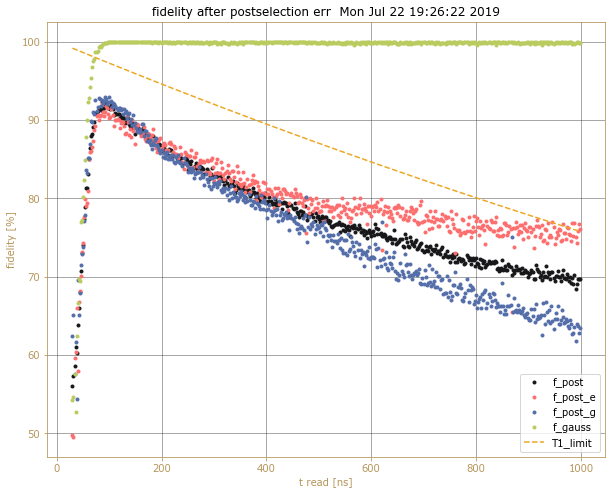

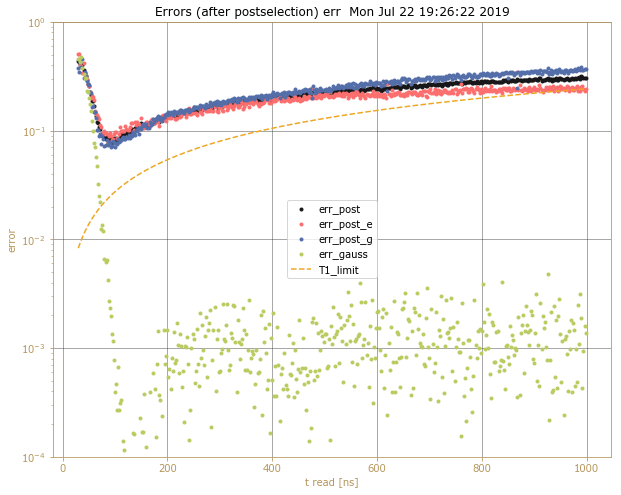

In [217]:
pic1 = plot_f_vs_tread(list_ssr_16)
pic2 = plot_err_vs_tread(list_ssr_16)


#### Rudat = 16 dB (more power), JPA ON

maximum fidelity postsel is: 92.33 %
optimal t read is 86.0  ns






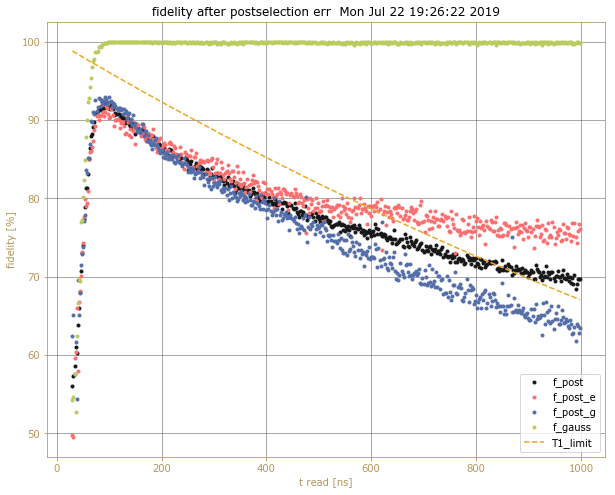

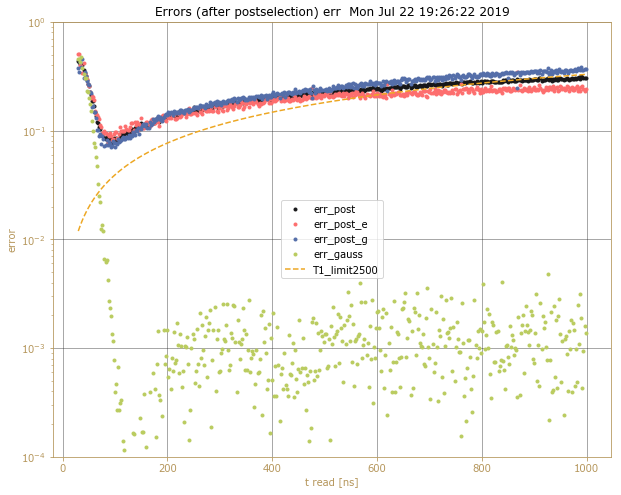

In [238]:
T1 = 2500
pic3 = plot_f_vs_tread(list_ssr_16,  t1=T1)
pic4 = plot_err_vs_tread(list_ssr_16, t1=T1)

# Plot seria of F_vs_t_read

In [257]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_16, fig_width=18, fig_high=12, save=True, fname='list_ssr_16_fid')
    pic2 = plot_err_vs_tread(list_ssr_16,fig_width=18, fig_high=12, save=True, fname='list_ssr_16_err')
except:
    print 'not succeed'
    

maximum fidelity postsel is: 92.33 %
optimal t read is 86.0  ns






In [258]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_19, fig_width=18, fig_high=12, save=True, fname='list_ssr_19_fid')
    pic2 = plot_err_vs_tread(list_ssr_19,fig_width=18, fig_high=12, save=True, fname='list_ssr_19_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 94.86 %
optimal t read is 164.0  ns






In [259]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_22, fig_width=18, fig_high=12, save=True, fname='list_ssr_22_fid')
    pic2 = plot_err_vs_tread(list_ssr_22,fig_width=18, fig_high=12, save=True, fname='list_ssr_22_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 95.49 %
optimal t read is 214.0  ns






In [260]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_22nj, fig_width=18, fig_high=12, save=True, fname='list_ssr_22nj_fid')
    pic2 = plot_err_vs_tread(list_ssr_22nj,fig_width=18, fig_high=12, save=True, fname='list_ssr_22nj_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 76.11 %
optimal t read is 996.0  ns






In [261]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x1, fig_width=18, fig_high=12, save=True, fname='list_ssr_x1_fid')
    pic2 = plot_err_vs_tread(list_ssr_x1,fig_width=18, fig_high=12, save=True, fname='list_ssr_x1_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 98.52 %
optimal t read is 80.0  ns






In [262]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x2, fig_width=18, fig_high=12, save=True, fname='list_ssr_x2_fid')
    pic2 = plot_err_vs_tread(list_ssr_x2,fig_width=18, fig_high=12, save=True, fname='list_ssr_x2_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 88.42 %
optimal t read is 18.0  ns






In [263]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x3, fig_width=18, fig_high=12, save=True, fname='list_ssr_x3_fid')
    pic2 = plot_err_vs_tread(list_ssr_x3,fig_width=18, fig_high=12, save=True, fname='list_ssr_x3_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 99.19 %
optimal t read is 91.0  ns






In [264]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x4, fig_width=18, fig_high=12, save=True, fname='list_ssr_x4_fid')
    pic2 = plot_err_vs_tread(list_ssr_x4,fig_width=18, fig_high=12, save=True, fname='list_ssr_x4_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 99.17 %
optimal t read is 86.0  ns






In [265]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x5, fig_width=18, fig_high=12, save=True, fname='list_ssr_x5_fid')
    pic2 = plot_err_vs_tread(list_ssr_x5,fig_width=18, fig_high=12, save=True, fname='list_ssr_x5_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 99.2 %
optimal t read is 80.0  ns






In [266]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x6, fig_width=18, fig_high=12, save=True, fname='list_ssr_x6_fid')
    pic2 = plot_err_vs_tread(list_ssr_x6,fig_width=18, fig_high=12, save=True, fname='list_ssr_x6_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 98.24 %
optimal t read is 137.0  ns






In [267]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x7, fig_width=18, fig_high=12, save=True, fname='list_ssr_x7_fid')
    pic2 = plot_err_vs_tread(list_ssr_x7,fig_width=18, fig_high=12, save=True, fname='list_ssr_x7_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 95.77 %
optimal t read is 61.0  ns






In [268]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x8, fig_width=18, fig_high=12, save=True, fname='list_ssr_x8_fid')
    pic2 = plot_err_vs_tread(list_ssr_x8,fig_width=18, fig_high=12, save=True, fname='list_ssr_x8_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 97.39 %
optimal t read is 105.0  ns






In [269]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x9, fig_width=18, fig_high=12, save=True, fname='list_ssr_x9_fid')
    pic2 = plot_err_vs_tread(list_ssr_x9,fig_width=18, fig_high=12, save=True, fname='list_ssr_x9_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 92.15 %
optimal t read is 76.0  ns






In [270]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x10, fig_width=18, fig_high=12, save=True, fname='list_ssr_x10_fid')
    pic2 = plot_err_vs_tread(list_ssr_x10,fig_width=18, fig_high=12, save=True, fname='list_ssr_x10_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 96.8 %
optimal t read is 120.0  ns






In [271]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x11, fig_width=18, fig_high=12, save=True, fname='list_ssr_x11_fid')
    pic2 = plot_err_vs_tread(list_ssr_x11,fig_width=18, fig_high=12, save=True, fname='list_ssr_x11_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 95.81 %
optimal t read is 130.0  ns






In [272]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x12, fig_width=18, fig_high=12, save=True, fname='list_ssr_x12_fid')
    pic2 = plot_err_vs_tread(list_ssr_x12,fig_width=18, fig_high=12, save=True, fname='list_ssr_x12_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 95.55 %
optimal t read is 240.0  ns






In [273]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x13, fig_width=18, fig_high=12, save=True, fname='list_ssr_x13_fid')
    pic2 = plot_err_vs_tread(list_ssr_x13,fig_width=18, fig_high=12, save=True, fname='list_ssr_x13_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 0.0 %
optimal t read is 10.0  ns






In [274]:
### to plot
try:
    pic1 = plot_f_vs_tread(list_ssr_x14, fig_width=18, fig_high=12, save=True, fname='list_ssr_x14_fid')
    pic2 = plot_err_vs_tread(list_ssr_x14,fig_width=18, fig_high=12, save=True, fname='list_ssr_x14_err')
except:
    print 'not succeed'

maximum fidelity postsel is: 0.0 %
optimal t read is 10.0  ns






# Finish of plot one by one

# BEST FIDELITY RESULTS FOR EACH LIST

saving
Distance:0.03; Theta:26
Amp:0.02; Phase:-155
Amp:0.01; Phase:27
Ratio amps: 0.75
regime: raw_data


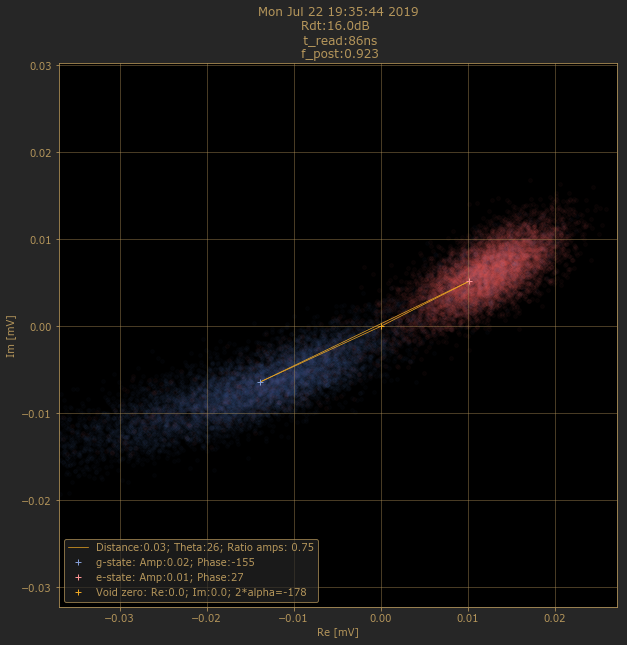

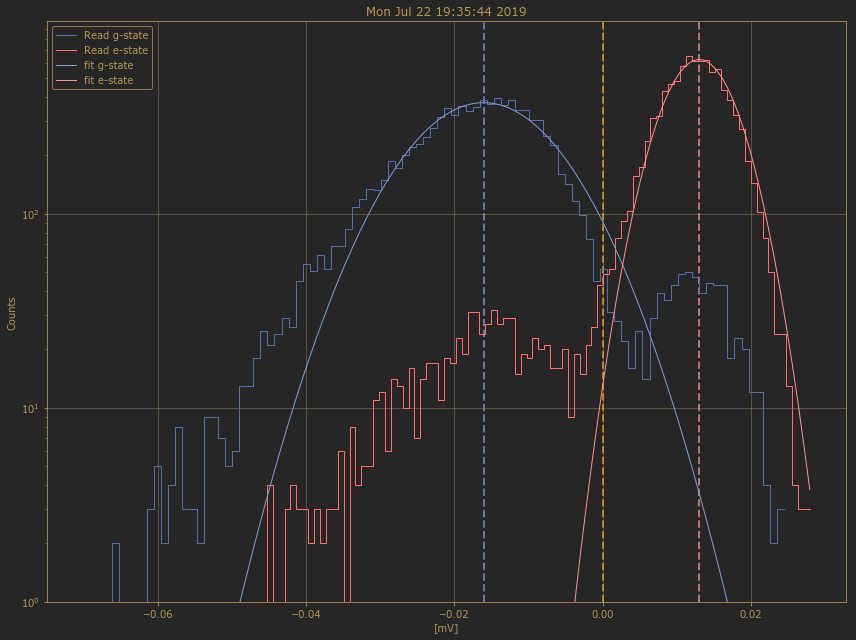

In [90]:
best_ind_16 = plot_best_res(list_ssr_16, save=True, fname='list_ssr_16_best')

saving
Distance:0.03; Theta:3
Amp:0.04; Phase:-175
Amp:0.01; Phase:-163
Ratio amps: 0.13
regime: raw_data


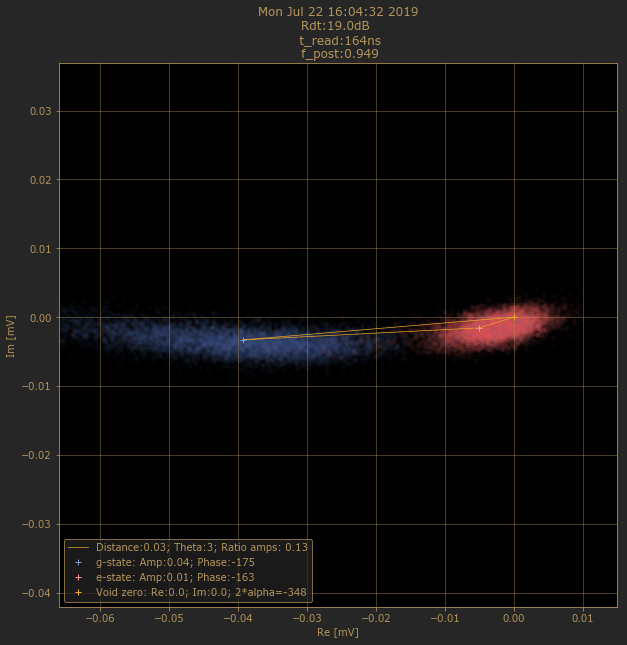

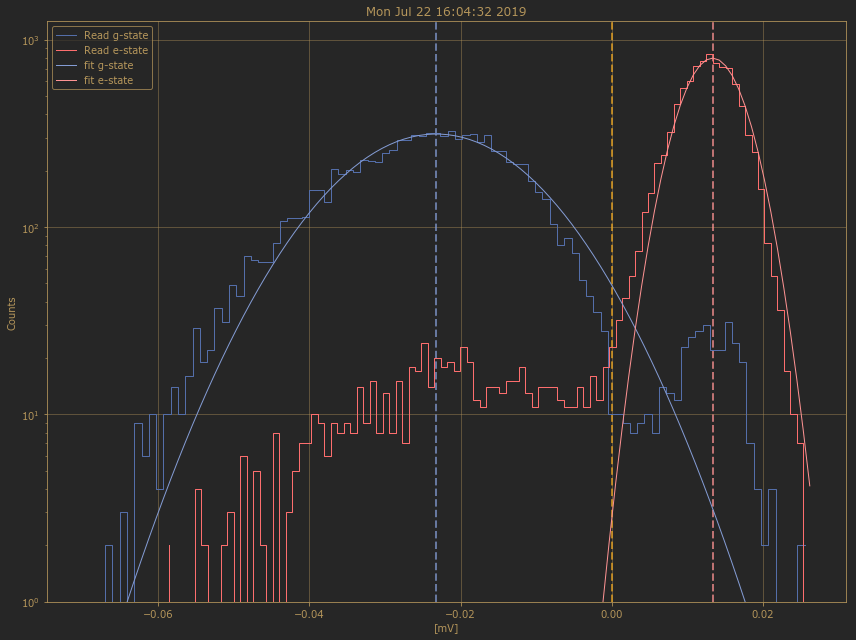

In [91]:
best_ind_19 = plot_best_res(list_ssr_19, save=True, fname='list_ssr_19_best')

saving
Distance:0.04; Theta:1
Amp:0.04; Phase:-178
Amp:0.0; Phase:-165
Ratio amps: 0.07
regime: raw_data


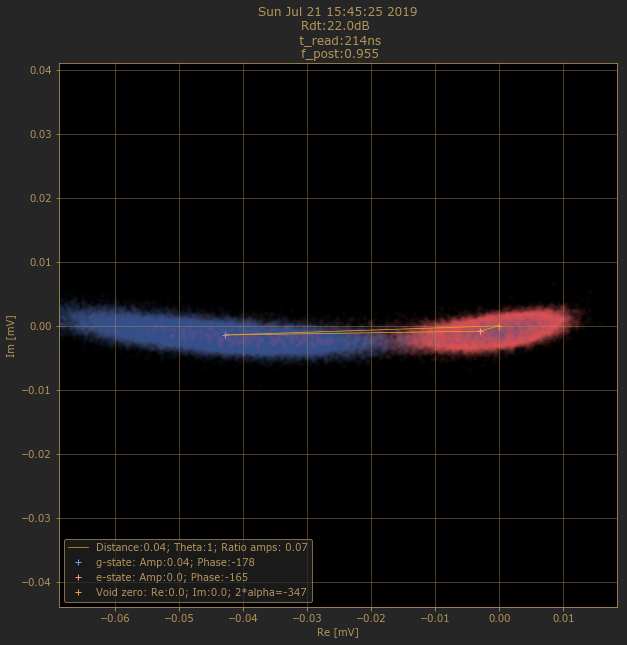

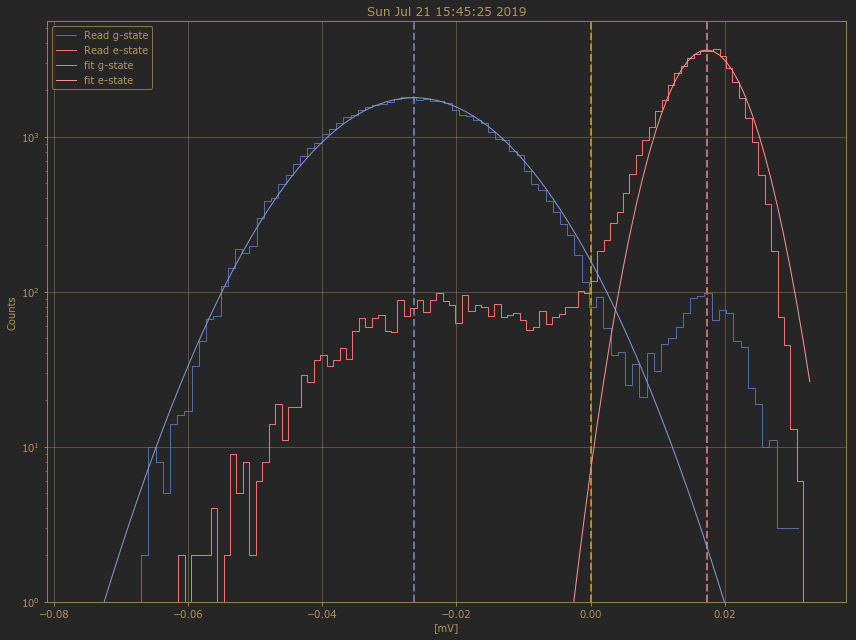

In [92]:
best_ind_22 = plot_best_res(list_ssr_22, save=True, fname='list_ssr_22_best')

saving
Distance:0.0; Theta:175
Amp:0.0; Phase:-84
Amp:0.0; Phase:-120
Ratio amps: 1.09
regime: raw_data


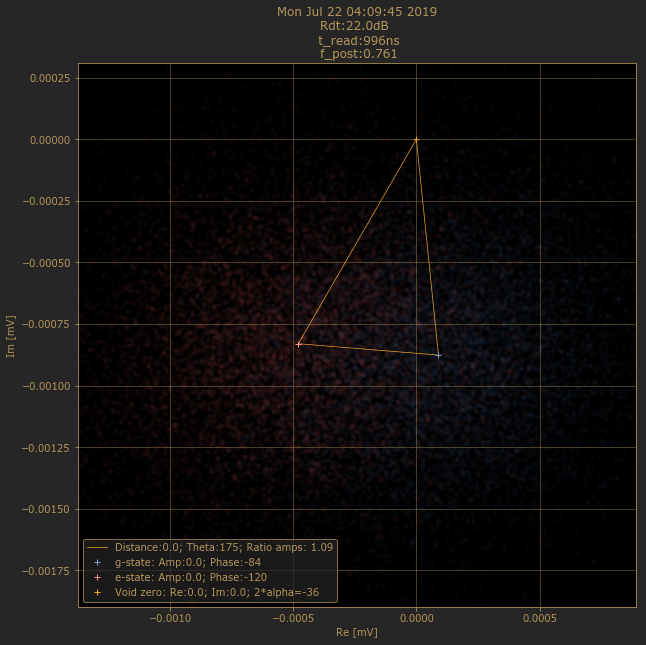

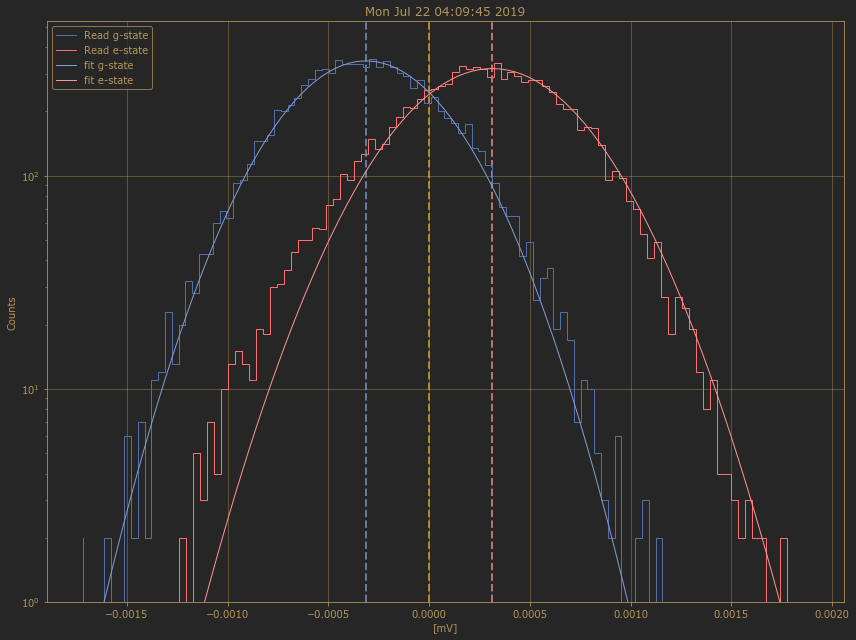

In [93]:
best_ind_22nj = plot_best_res(list_ssr_22nj, save=True, fname='list_ssr_22nj_best')

saving
Distance:0.01; Theta:-12
Amp:0.0; Phase:175
Amp:0.01; Phase:-14
Ratio amps: 2.52
regime: raw_data


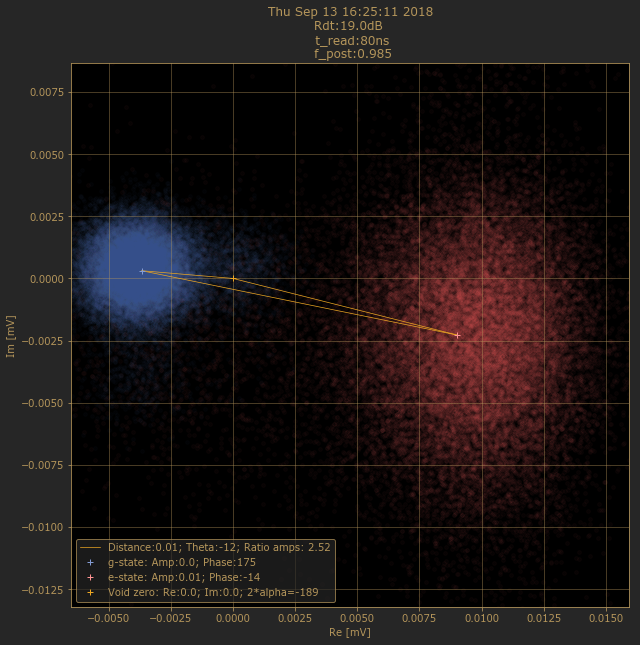

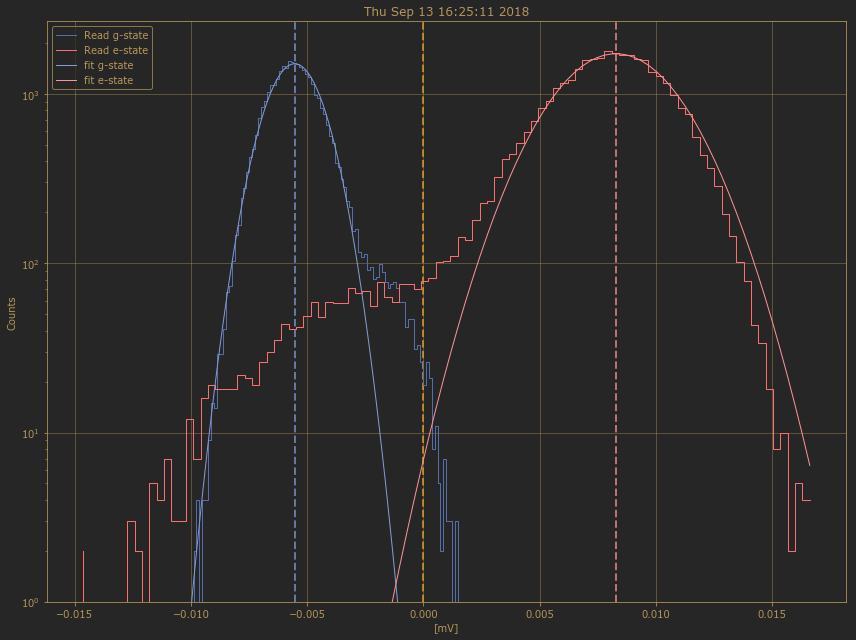

In [94]:
best_ind_x1 = plot_best_res(list_ssr_x1, save=True, fname='list_ssr_x1_best')

saving
Distance:0.0; Theta:-28
Amp:0.0; Phase:168
Amp:0.0; Phase:-36
Ratio amps: 2.08
regime: raw_data


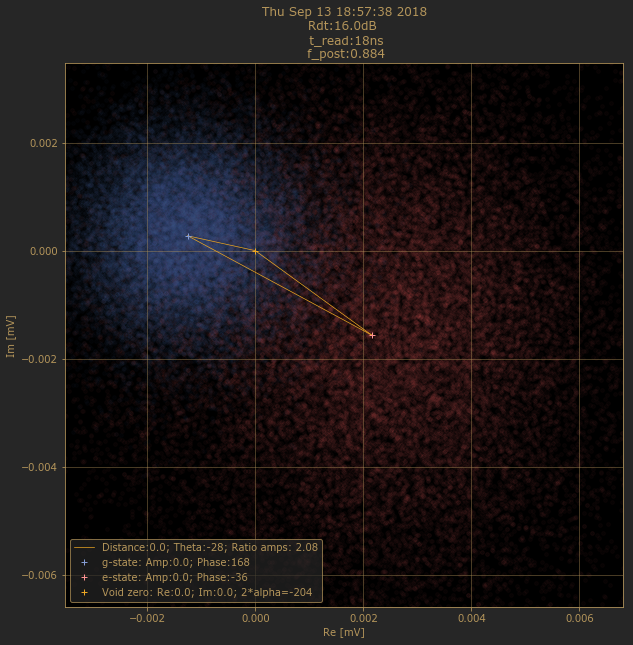

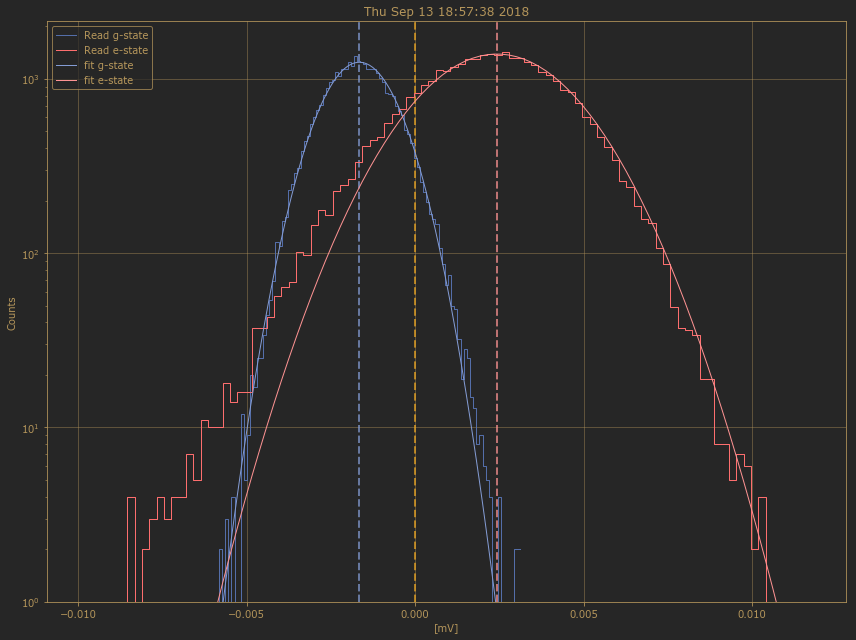

In [95]:
best_ind_x2 = plot_best_res(list_ssr_x2, save=True, fname='list_ssr_x2_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.06; Theta:-1
Amp:0.01; Phase:-177
Amp:0.04; Phase:-2
Ratio amps: 3.33
regime: raw_data


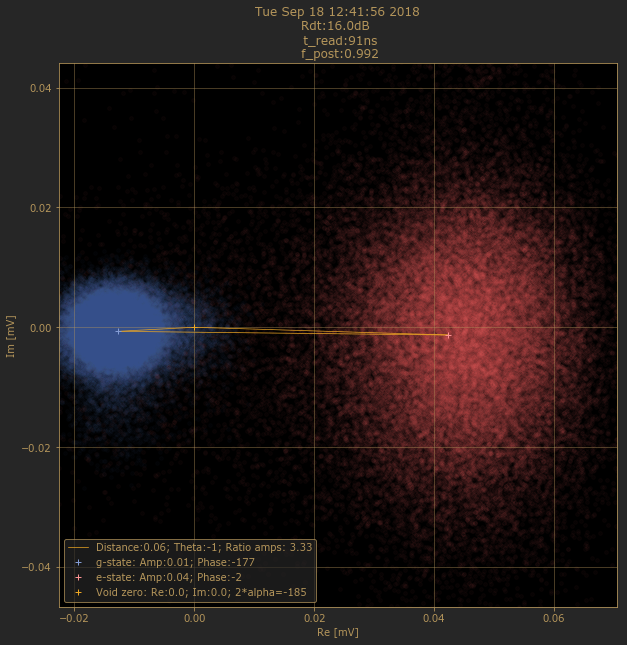

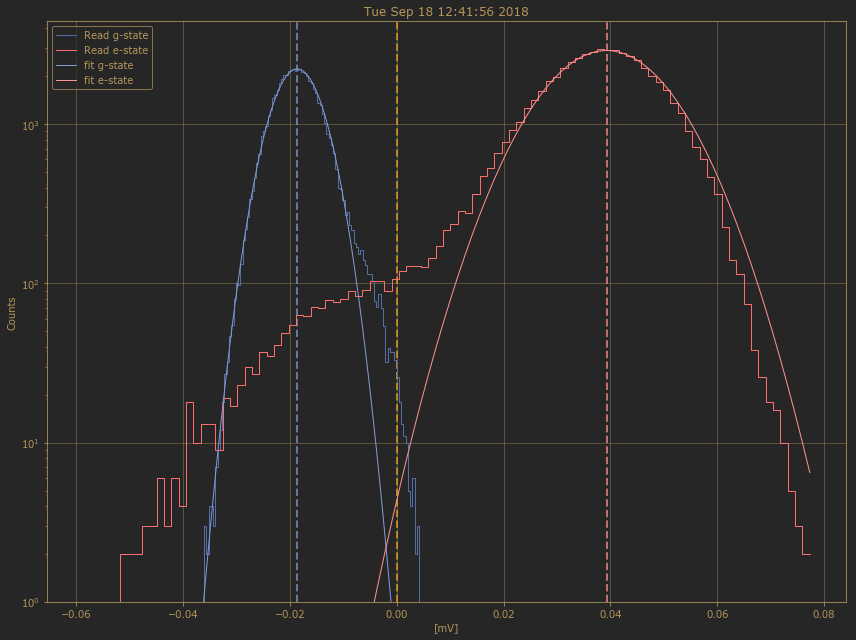

In [96]:
best_ind_x3 = plot_best_res(list_ssr_x3, save=True, fname='list_ssr_x3_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.05; Theta:2
Amp:0.01; Phase:-174
Amp:0.04; Phase:0
Ratio amps: 3.41
regime: raw_data


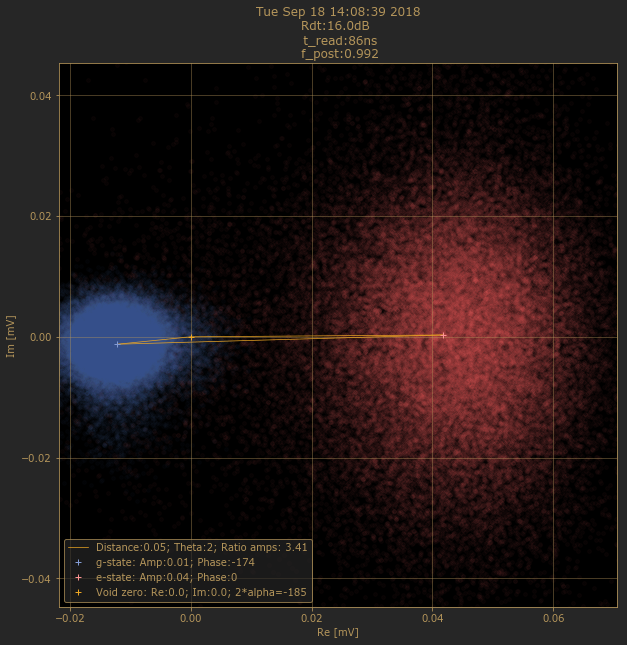

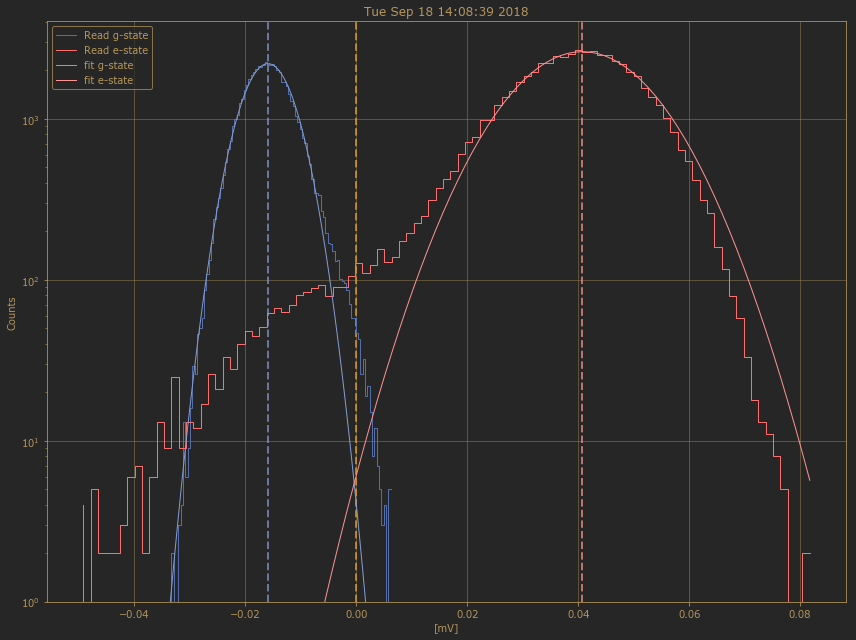

In [97]:
best_ind_x4 = plot_best_res(list_ssr_x4, save=True, fname='list_ssr_x4_best')

saving
Distance:0.05; Theta:4
Amp:0.01; Phase:-173
Amp:0.03; Phase:2
Ratio amps: 2.95
regime: raw_data


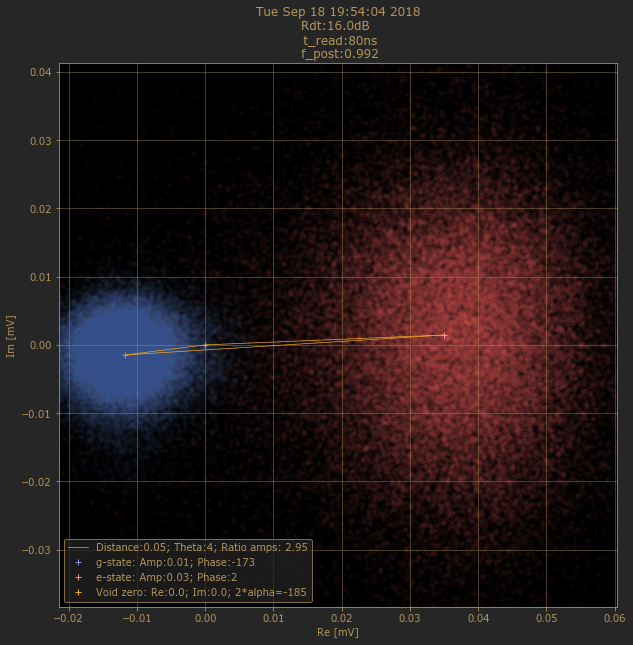

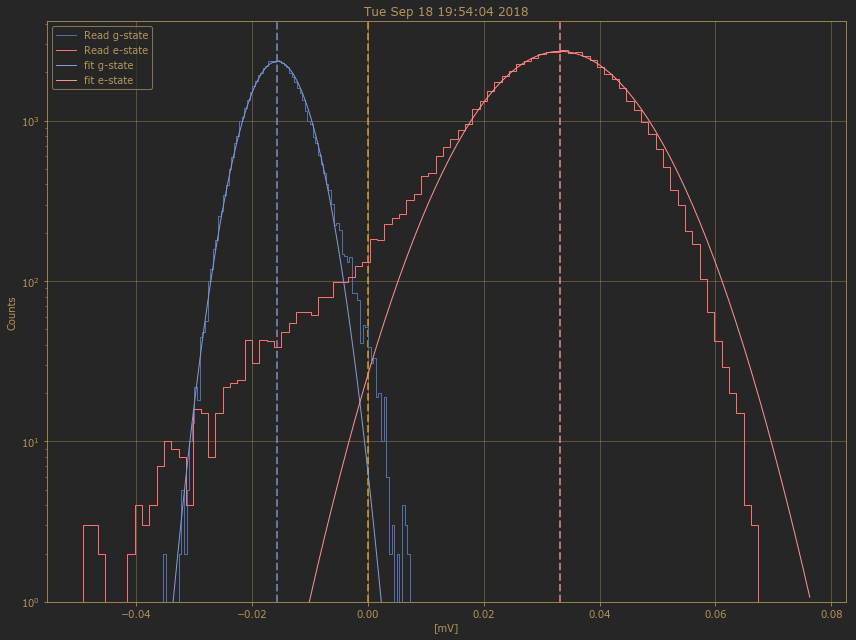

In [100]:
best_ind_x5 = plot_best_res(list_ssr_x5, save=True, fname='list_ssr_x5_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.04; Theta:-11
Amp:0.01; Phase:-9
Amp:0.05; Phase:-11
Ratio amps: 5.19
regime: raw_data


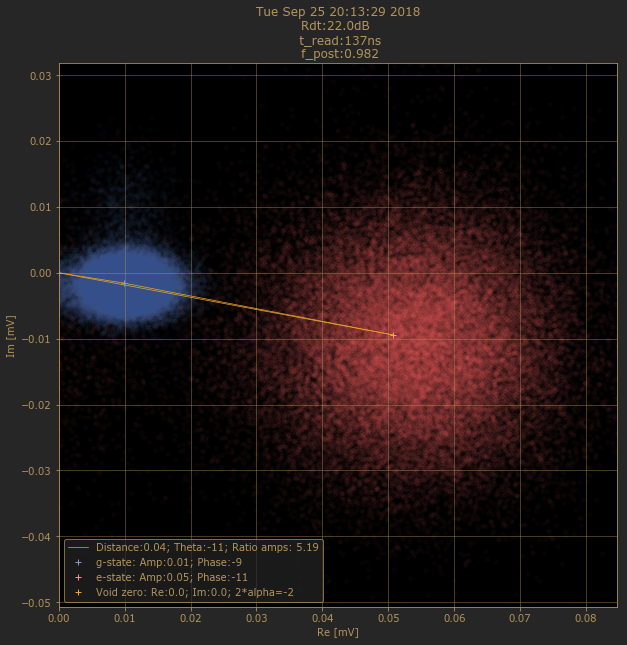

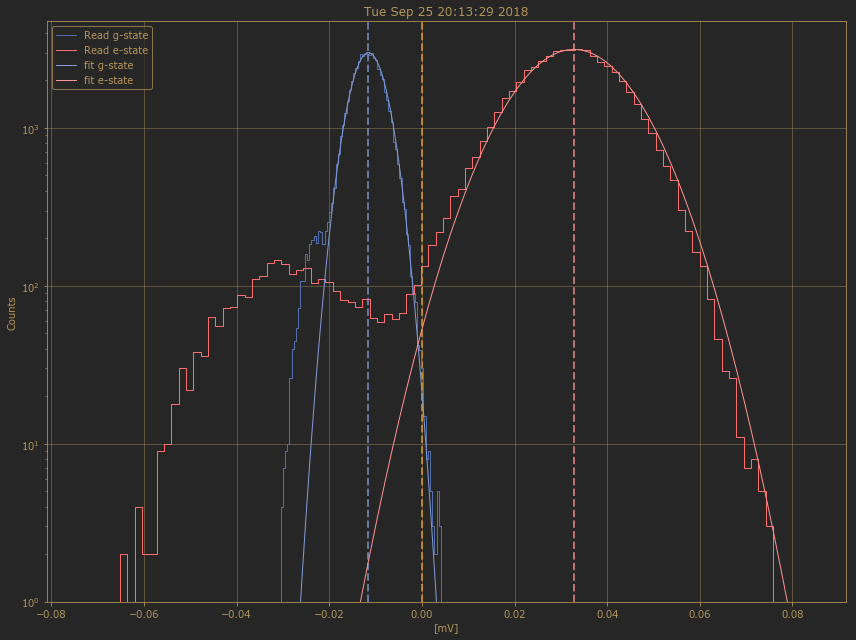

In [101]:
best_ind_x6 = plot_best_res(list_ssr_x6, save=True, fname='list_ssr_x6_best')

saving
Distance:0.01; Theta:-44
Amp:0.0; Phase:-41
Amp:0.01; Phase:-44
Ratio amps: 6.32
regime: raw_data


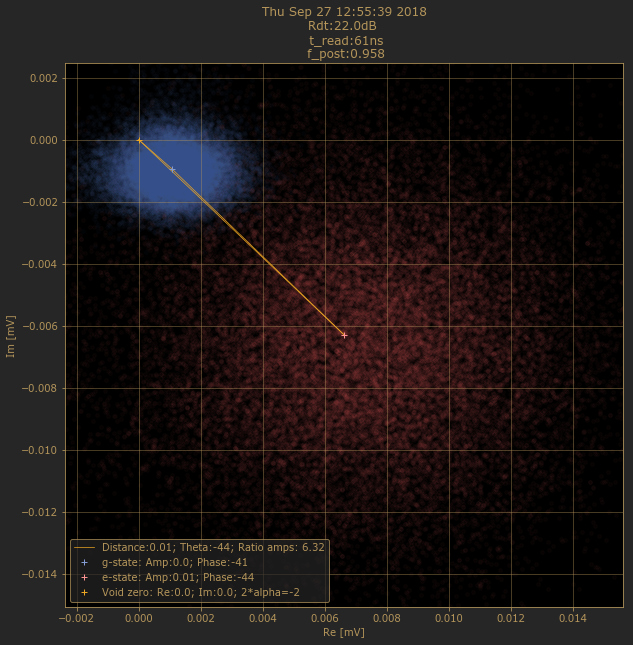

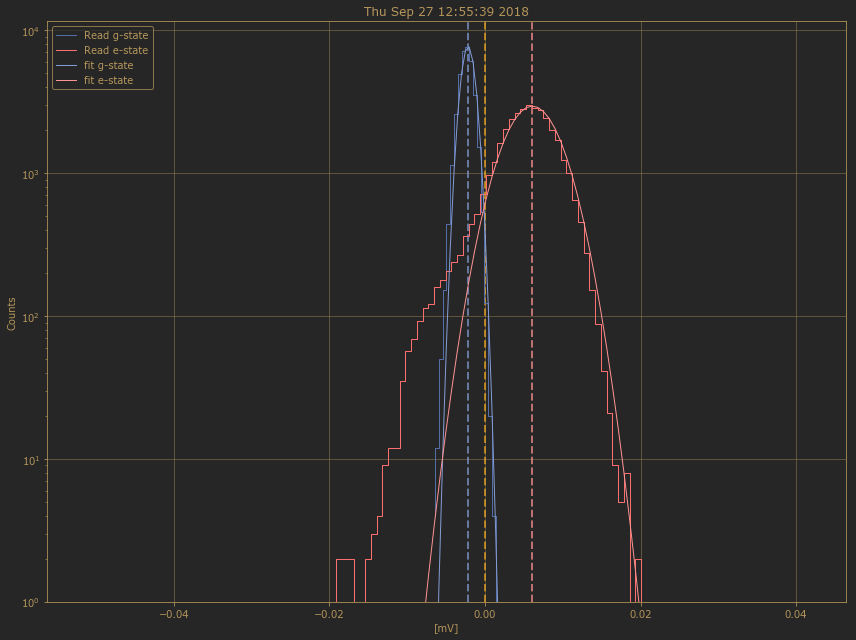

In [102]:
best_ind_x7 = plot_best_res(list_ssr_x7, save=True, fname='list_ssr_x7_best')

saving
Distance:0.01; Theta:-42
Amp:0.0; Phase:-36
Amp:0.01; Phase:-41
Ratio amps: 6.3
regime: raw_data


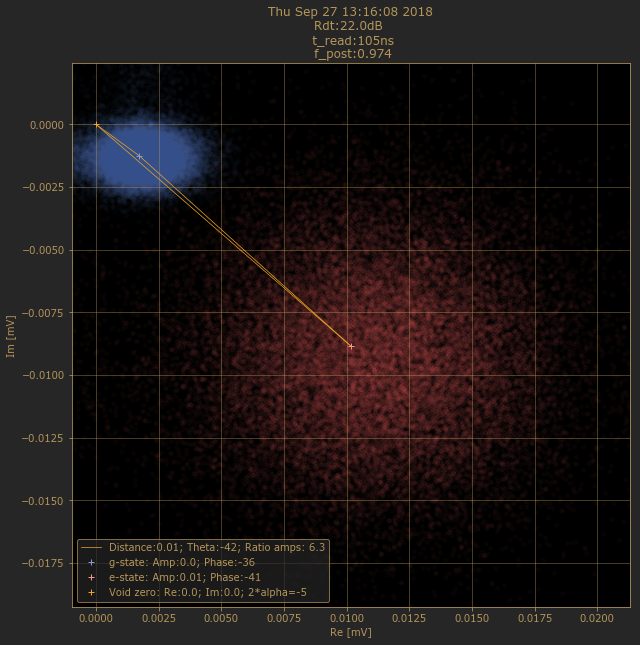

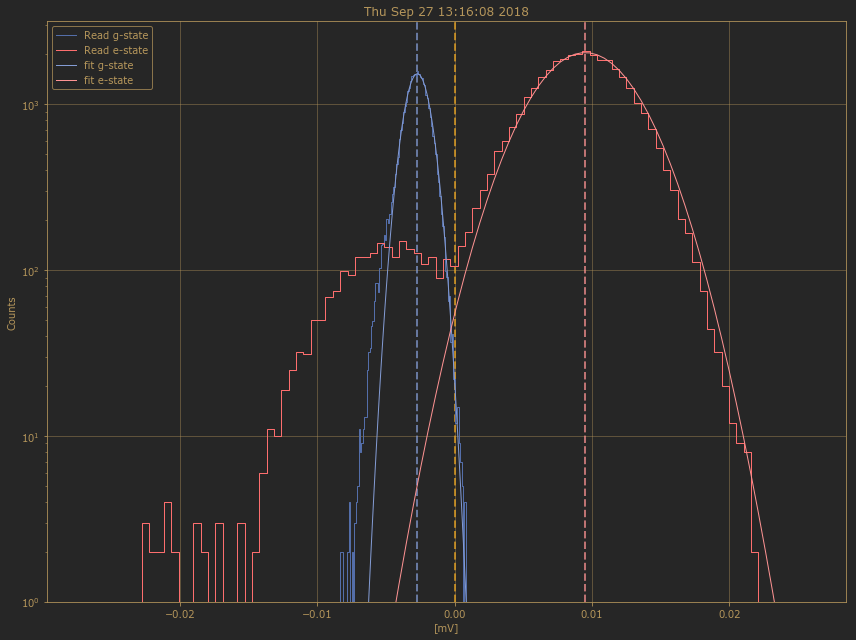

In [103]:
best_ind_x8 = plot_best_res(list_ssr_x8, save=True, fname='list_ssr_x8_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.01; Theta:-39
Amp:0.0; Phase:-36
Amp:0.01; Phase:-38
Ratio amps: 2.92
regime: raw_data


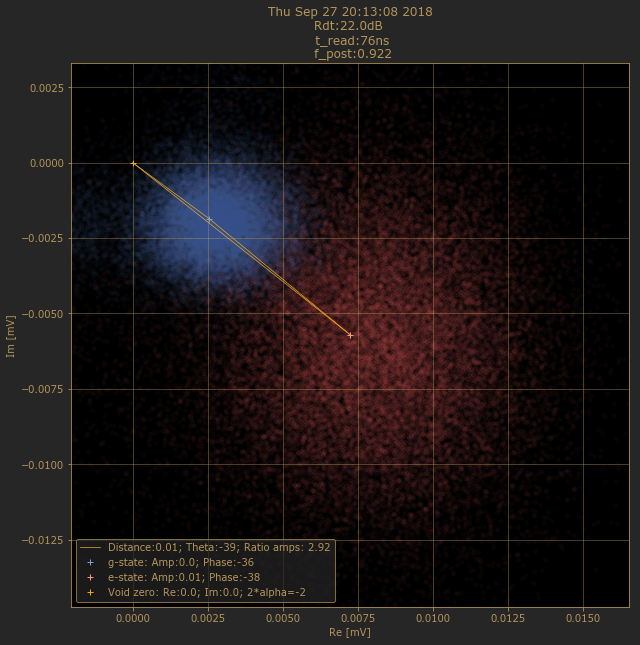

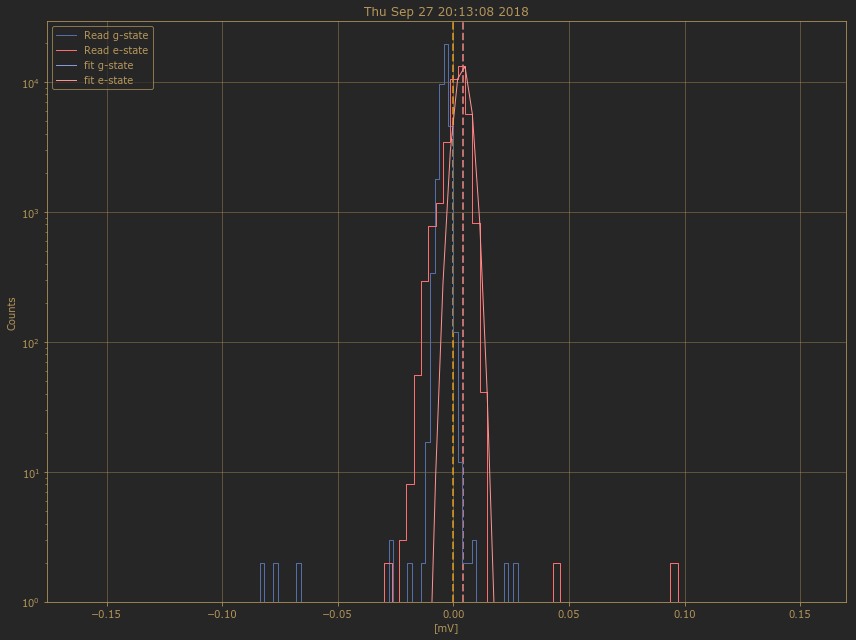

In [104]:
best_ind_x9 = plot_best_res(list_ssr_x9, save=True, fname='list_ssr_x9_best')

saving
Distance:0.09; Theta:-20
Amp:0.03; Phase:150
Amp:0.06; Phase:-15
Ratio amps: 1.73
regime: raw_data


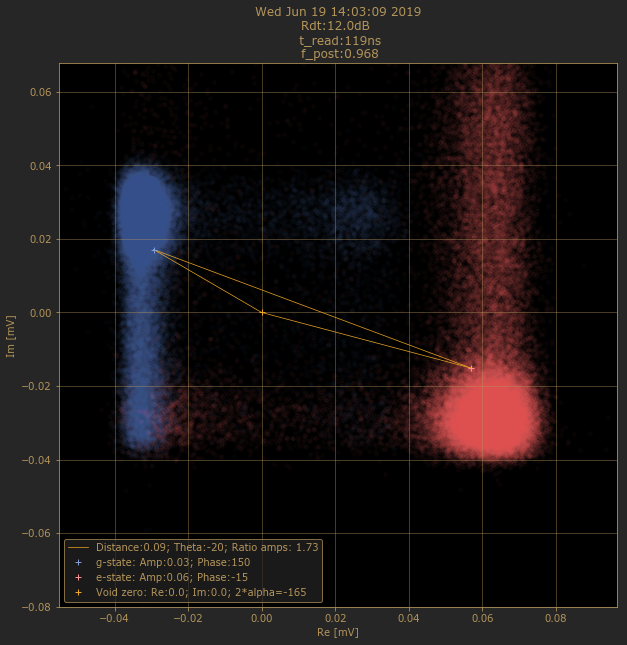

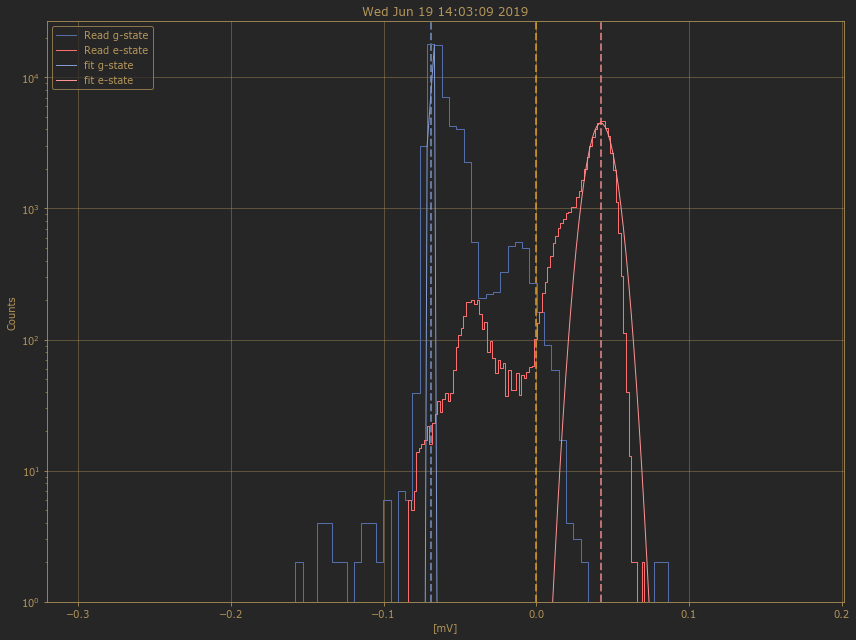

In [113]:
best_ind_x10 = plot_best_res(list_ssr_x10, save=True, fname='list_ssr_x10_best')

saving
Distance:0.08; Theta:-40
Amp:0.03; Phase:126
Amp:0.05; Phase:-32
Ratio amps: 1.82
regime: raw_data


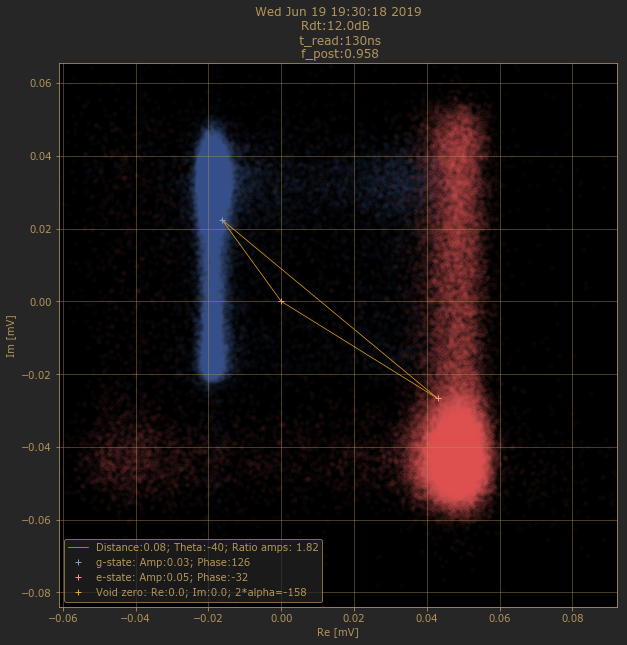

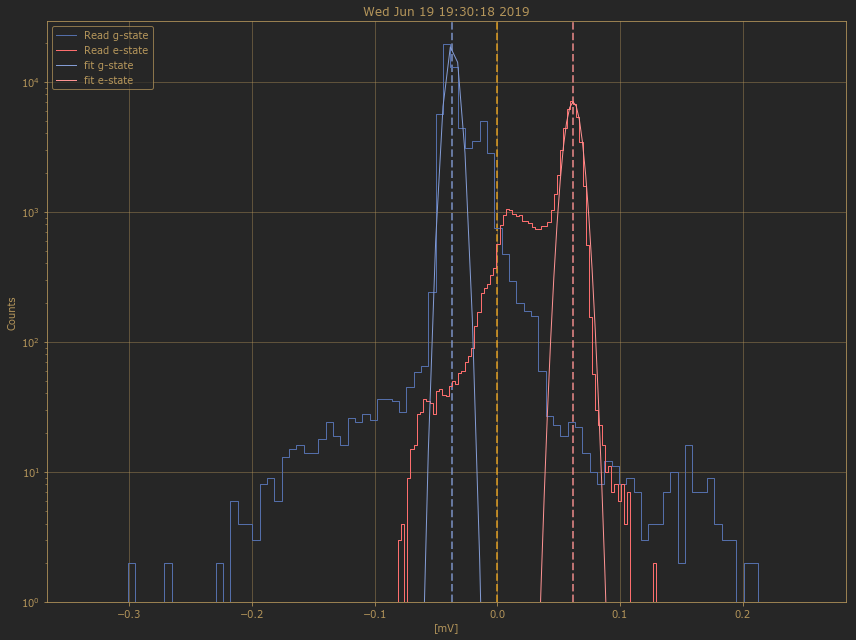

In [106]:
best_ind_x11 = plot_best_res(list_ssr_x11, save=True, fname='list_ssr_x11_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.1; Theta:-15
Amp:0.04; Phase:156
Amp:0.05; Phase:-9
Ratio amps: 1.22
regime: raw_data


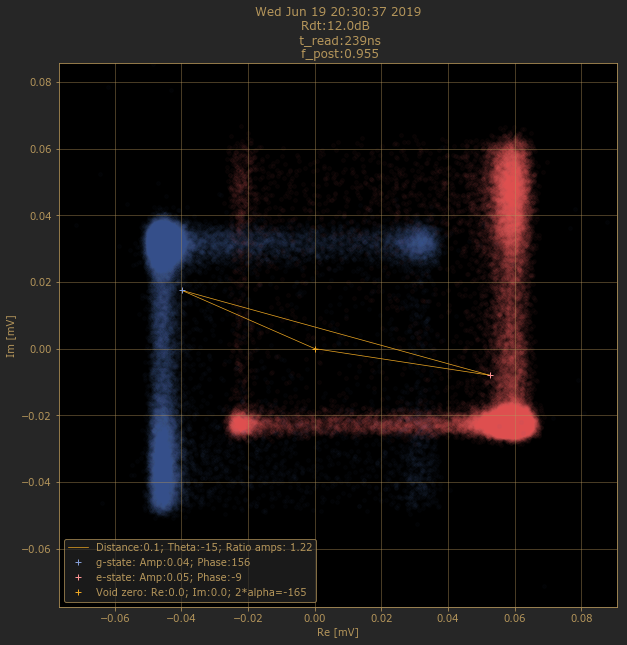

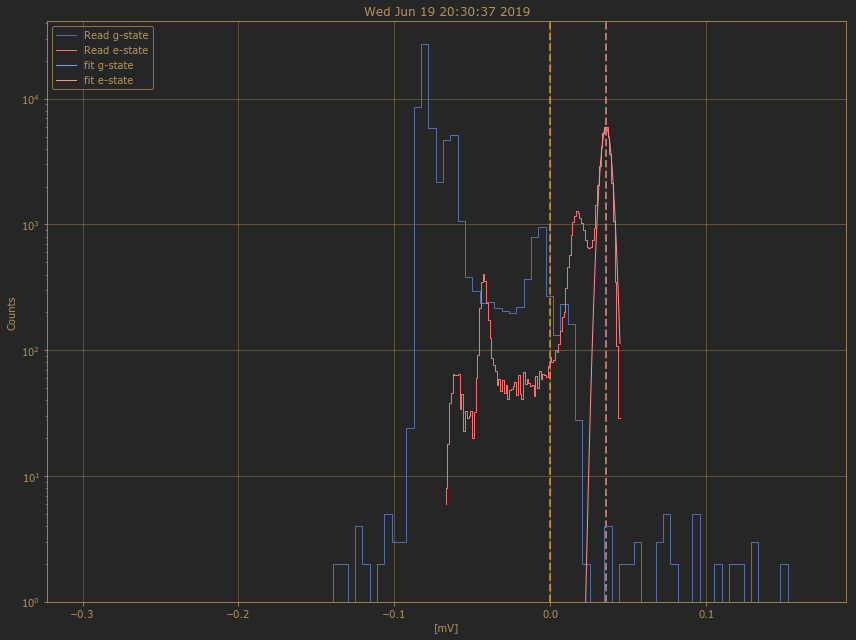

In [107]:
best_ind_x12 = plot_best_res(list_ssr_x12, save=True, fname='list_ssr_x12_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.0; Theta:-130
Amp:0.0; Phase:-139
Amp:0.0; Phase:-134
Ratio amps: 2.32
regime: raw_data


AttributeError: 'NoneType' object has no attribute 'hist_xy'

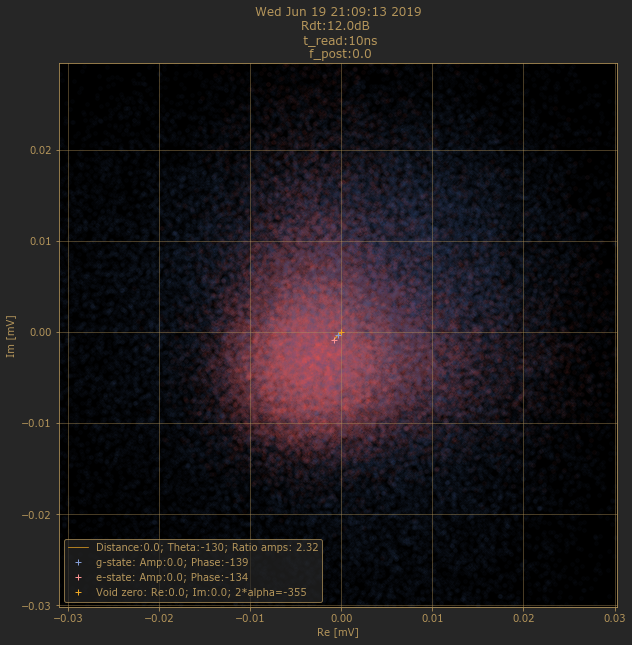

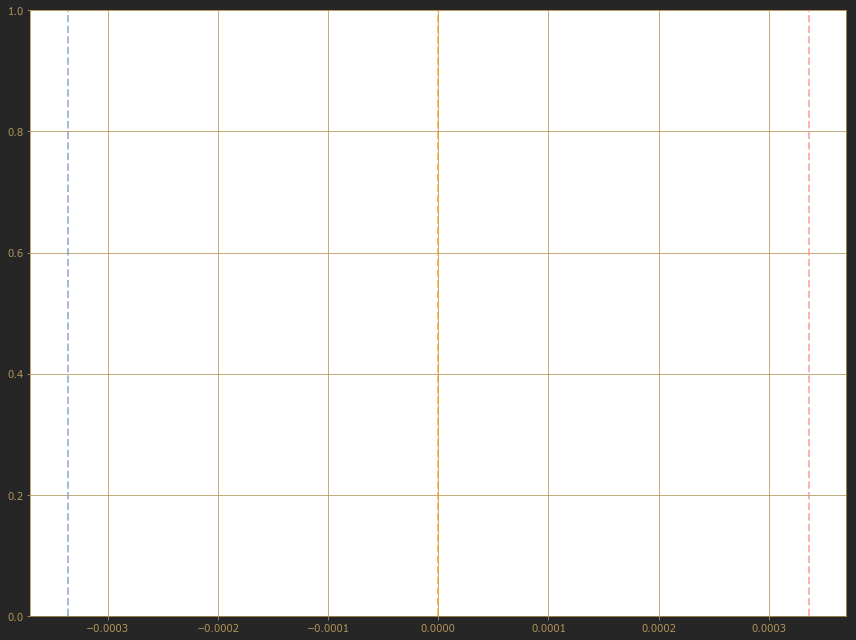

In [108]:
best_ind_x13 = plot_best_res(list_ssr_x13, save=True, fname='list_ssr_x13_best')

saving
It is no raw data. 
 loading...
data loaded
Distance:0.0; Theta:-135
Amp:0.0; Phase:-134
Amp:0.0; Phase:-134
Ratio amps: 2.02
regime: raw_data


AttributeError: 'NoneType' object has no attribute 'hist_xy'

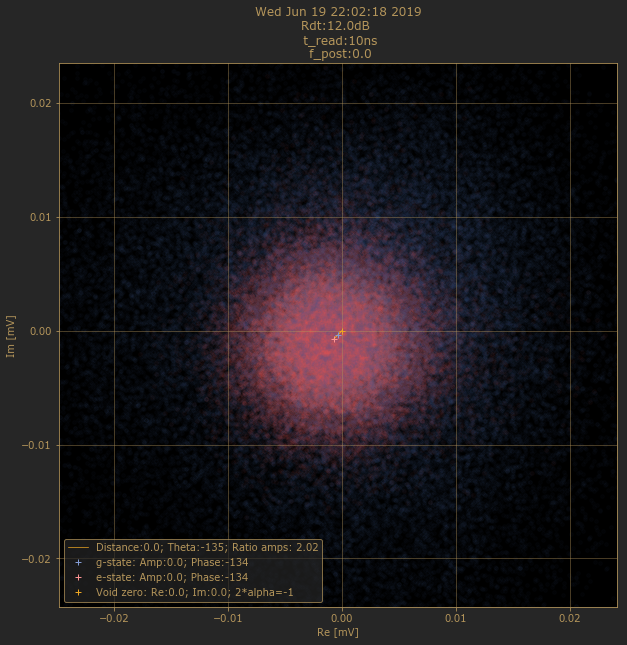

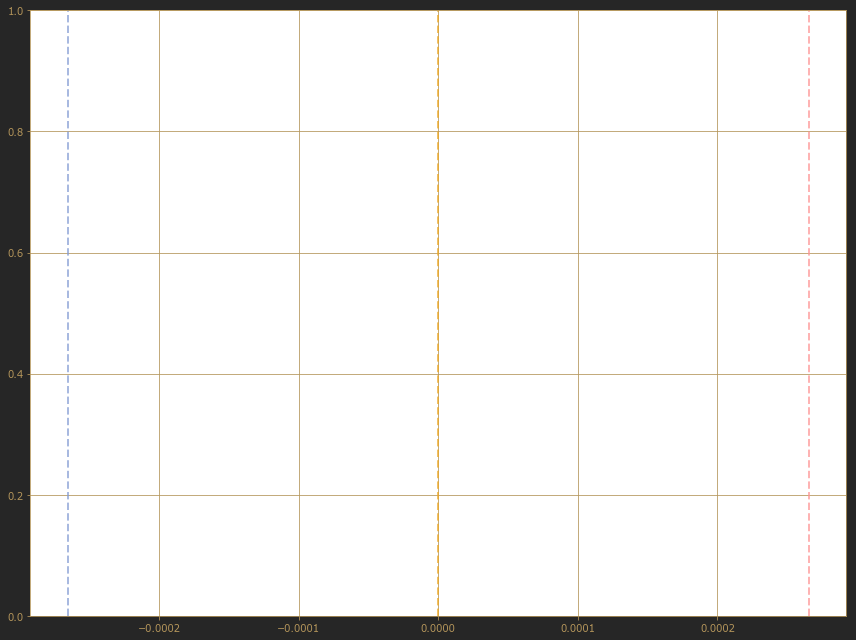

In [109]:
best_ind_x14 = plot_best_res(list_ssr_x14, save=True, fname='list_ssr_x14_best')

# DIG DEEPER

# x10,x11,x12,x13,x14 - ortogonal squeezing. Strange. Can not rpocess
## it all from 19 June of 2019

In [142]:
i=50

In [143]:
pic = list_ssr_x10[i].plot_scatter_two_blob(dark=True)
list_ssr_x10[i].dict_fidelity

IndexError: list index out of range

Distance:0.05; Theta:-10
Amp:0.01; Phase:147
Amp:0.03; Phase:-1
Ratio amps: 2.41


{'Err_e': 0.098299999999999998,
 'Err_g': 0.051399984276176425,
 'F': 0.92515,
 'F_e': 0.9486,
 'F_g': 0.9017,
 'F_gaus': 0.99999999213808821,
 'F_gaus_eg': 0.99999998427617642,
 'F_gaus_ge': 1.0,
 'F_post': 0.92515,
 'F_post_e': 0.9486,
 'F_post_g': 0.9017}

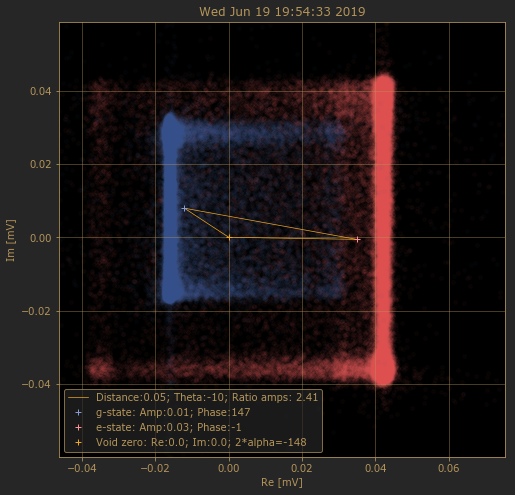

In [153]:
pic = list_ssr_x11[i].plot_scatter_two_blob(dark=True, figsize=[8,8])
list_ssr_x11[i].dict_fidelity

Distance:0.08; Theta:-8
Amp:0.03; Phase:163
Amp:0.04; Phase:-1
Ratio amps: 1.3


{'Err_e': nan,
 'Err_g': 0.016033333333333333,
 'F': 0.9315666666666667,
 'F_e': 0.9839666666666667,
 'F_g': 0.8791666666666667,
 'F_gaus': nan,
 'F_gaus_eg': 1.0,
 'F_gaus_ge': nan,
 'F_post': 0.9315666666666667,
 'F_post_e': 0.9839666666666667,
 'F_post_g': 0.8791666666666667}

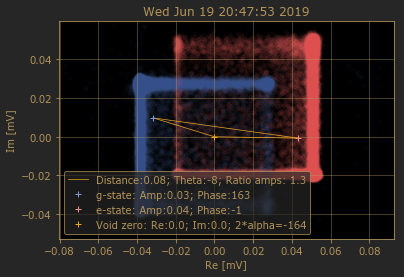

In [149]:
pic = list_ssr_x12[i].plot_scatter_two_blob(dark=True)
list_ssr_x12[i].dict_fidelity

It is no raw data. 
 loading...
data loaded
Distance:0.09; Theta:-4
Amp:0.05; Phase:172
Amp:0.04; Phase:2
Ratio amps: 0.79


{'Err_e': 0,
 'Err_g': 0,
 'F': 0,
 'F_e': 0,
 'F_g': 0,
 'F_gaus': 0,
 'F_gaus_eg': 0,
 'F_gaus_ge': 0,
 'F_post': 0,
 'F_post_e': 0,
 'F_post_g': 0}

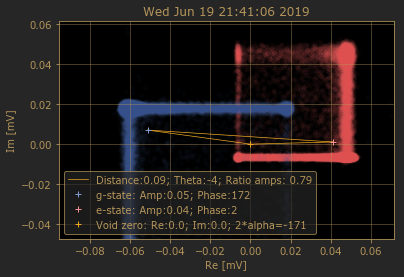

In [146]:
pic = list_ssr_x13[i].plot_scatter_two_blob(dark=True)
list_ssr_x13[i].dict_fidelity

Distance:0.09; Theta:-4
Amp:0.06; Phase:174
Amp:0.03; Phase:2
Ratio amps: 0.47


{'Err_e': 0,
 'Err_g': 0,
 'F': 0,
 'F_e': 0,
 'F_g': 0,
 'F_gaus': 0,
 'F_gaus_eg': 0,
 'F_gaus_ge': 0,
 'F_post': 0,
 'F_post_e': 0,
 'F_post_g': 0}

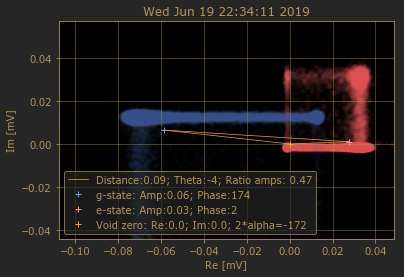

In [147]:
pic = list_ssr_x14[i].plot_scatter_two_blob(dark=True)
list_ssr_x14[i].dict_fidelity

# FINISH FINISH FINISH

In [48]:
print stop

NameError: name 'stop' is not defined

## Plot fid_vs_tread for different pulse power in one window

In [ ]:
def plot_f_vs_tread_vs_rudat(list_of_list_dicts, wanted_parameter='F_post'):
    
    
    fig = plt.figure(figsize=[15,7])
    ax = fig.add_subplot(1, 1, 1)
    
    for list_dicts in list_of_list_dicts:

        list_tread = []
        list_f_post = []

        for linedic in list_dicts:
            list_tread.append( 1e9 * linedic[0]['t_read']  )

            list_f_post.append( 100* linedic[1][wanted_parameter]  )

        ax.plot( list_tread, list_f_post,   '.', label='rudat= '+str(linedic[0]['rudat']))
   
    ax.set_title(wanted_parameter)
    ax.set_ylabel('fidelity [%]')
    ax.set_xlabel('t read [ns]')
#     ax.set_yscale('log')
    ax.set_ylim([50,100])
#     ax.set_xlim([0,100])
    ax.legend()



### Show blolbs for given t_read

In [ ]:
def blob_with_tread(tread, list_dicts):
    '''
    takes wanted value in ns
    takes list of dictionaries (find filename there)
    '''
    
    list_difference = []
    for linedic in list_dicts:
        list_difference.append( abs(tread - 1e9 * linedic[0]['t_read']) )
        
    wanted_arg = np.argmin(list_difference)
    wanted_dic_line = list_dicts[wanted_arg]
    
    SRR_obj = SSResult(wanted_dic_line[3], paramfile = wanted_dic_line[4])
    pic1 = SRR_obj.plot_scatter_two_blob(dark=True, crop=False, renorm=False)
    pic2 = SRR_obj.plot_hist_1D_withpost()
#     return [pic1,pic2]
    return wanted_dic_line
    


### T1:
#### 16dB  ---     3300 - 3500 ns

#### 19dB  ---     3300 - 3400 ns

#### 22dB  ---     3500 - 3700 ns

#### 22dB (nojpa) 3300 - 3400 ns

In [ ]:
list_of_lists = [list_dicts22nj, list_dicts22, list_dicts19, list_dicts16]
plot_f_vs_tread_vs_rudat(list_of_lists, wanted_parameter='F')
plot_f_vs_tread_vs_rudat(list_of_lists, wanted_parameter='F_post')


In [ ]:
dicdic1 = blob_with_tread(500, list_dicts16)

In [ ]:
dicdic1 = blob_with_tread(120, list_dicts19)

In [ ]:
dicdic1 = blob_with_tread(120, list_dicts22)

In [ ]:
# list_ssr_x3 = load_data(list_dat_x3, list_param_x3)

i=2
ssr_x3_0 = SSResult(list_dat_x3[i], paramfile = list_param_x3[i])

# list_dat_x3[0]


In [ ]:
i=0
ssr_x3_0 = SSResult(list_dat_x3[i], paramfile = list_param_x3[i])